In [1]:
#use wdtools_env_pip environment

import numpy as np
from math import log10, floor
from bisect import bisect_left
from scipy import stats
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.colors as pltcolors
plt.style.use('Software/stefan.mplstyle')

import pandas as pd
pd.set_option('display.max_columns', None)
# Suppress SettingWithCopyWarnings
pd.options.mode.chained_assignment = None  # default='warn'

#for machine learning
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.models import load_model


# This notebook trains a machine learning method to reconstruct the correlation length in the simulation with with binary contamination added and where try to remove binaries with a simple cut (simulation=4)
- Use a deep learning approach with a convolutional neural network. CNNs are designed to automatically learn hierarchical features from raw data (usually images), so they are well suited to detect the peak/drop-off structure in the Moran's I x Z-Score curve that is useful in identifying the correlation length without me needing to do manual feature extraction. 
    - Use just the 1D Moran's I x Z-Score curve, don't include the distance array since the CNN will learn that scale from the labeled true correlation length
    - Don't cut the peak at small distances since the CNN should learn that feature doesn't necessarily drive the labeled true correlation length

# Import the simulation outputs

In [2]:
def get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type,nonzero_weight_cut=20,plot=True):
    #read back in measurements
    noise_label="".join(noise_effect_array)
    
    #sample_type='training','testing', or 'bootstrap'
    if sample_type=='training':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']
        
    if sample_type=='testing':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']

    Ws = npzfile['Ws']
    final_distances = npzfile['distances']
    moransIs = npzfile['moransIs'] 
    expectations = npzfile['expectations']
    variances = npzfile['variances']
    zscores = npzfile['zscores']
    
    mult=[]
    for i in range(len(moransIs)):
        mult.append(moransIs[i]*zscores[i])
        
    #cut to make sure have enough nonzero weights for valid results
    index = bisect_left(Ws, nonzero_weight_cut)
    
    if plot:
        #plot
        fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(6,15),sharex=True)
        ax1.plot(final_distances,moransIs)
        ax1.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax1.axvline(corr_length,color='green',label='True Correlation\nLength')
        ax1.axhline(expectations[0],color='red',label='No Correlation')
        ax1.set_ylabel("Moran's I")
        ax1.legend()

        ax2.plot(final_distances,zscores)
        ax2.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax2.axvline(corr_length,color='green')
        ax2.set_ylabel('Z-score')

        ax3.plot(final_distances,mult)
        ax3.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax3.axvline(corr_length,color='green')
        ax3.set_xlabel('Distance Cut')
        ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

        plt.subplots_adjust(wspace = 0,hspace=0)
        plt.show()
    
    return(final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index)


In [3]:
def count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type):
    
    #turn into combined simulation parameter array
    simulation_params=[]
    for corr_length in corr_lengths:
        for epsilon in epsilons:
            simulation_params.append([corr_length,epsilon])
            
    noise_label="".join(noise_effect_array)
    
    simulation_params_not_run=[]
    simulation_params_run=[]
    
    #check if each training data simulation has been run
    for i in range(len(simulation_params)):
        simulation=simulation_params[i]
        corr_length=simulation[0]
        epsilon=simulation[1]
        try:
            if sample_type=='training':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            if sample_type=='testing':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            simulation_params_run.append(simulation)
            #print('Simulation exists, ', simulation)
        except:
            simulation_params_not_run.append(simulation)
            #print('No simulation exists, ', simulation)

    return(simulation_params_run,simulation_params_not_run)


In [4]:
#for training data
corr_lengths=np.round(np.append(np.linspace(1,98,30)[1:],np.logspace(2,3,num=100)[1:-1]),2)
def round_sig(x,sig):
    return round(x, sig-int(floor(log10(abs(x))))-1)
epsilons_init=np.append(np.logspace(-10,-1,num=20),np.linspace(0.1,0.5,4)[1:])
epsilons=[]
for e in epsilons_init:
    epsilons.append(round_sig(e,2))

#for testing data
corr_lengths_testing=[10,25,50,75,100,150,200,250,300,400,500,600,700,800,900,1000]
epsilons_testing=[1e-10,1e-7,1e-4,0.001,0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]

In [5]:
sample_size=10207
noise_effect_array=['0','0','1','0','0']
improvement_factor=1
effect_strength=1
chance_companion=0.01
remove_likely_binaries='1'

#count how many simulations have been run

simulation_params_run,simulation_params_not_run=count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

print('training')
print(len(simulation_params_run))
print(len(simulation_params_not_run))
print('')

simulation_params_run_testing,simulation_params_not_run_testing=count_simulations(corr_lengths_testing,epsilons_testing,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'testing')
print('testing')
print(len(simulation_params_run_testing))
print(len(simulation_params_not_run_testing))

training
2921
0

testing
256
0


98.0 8.9e-10


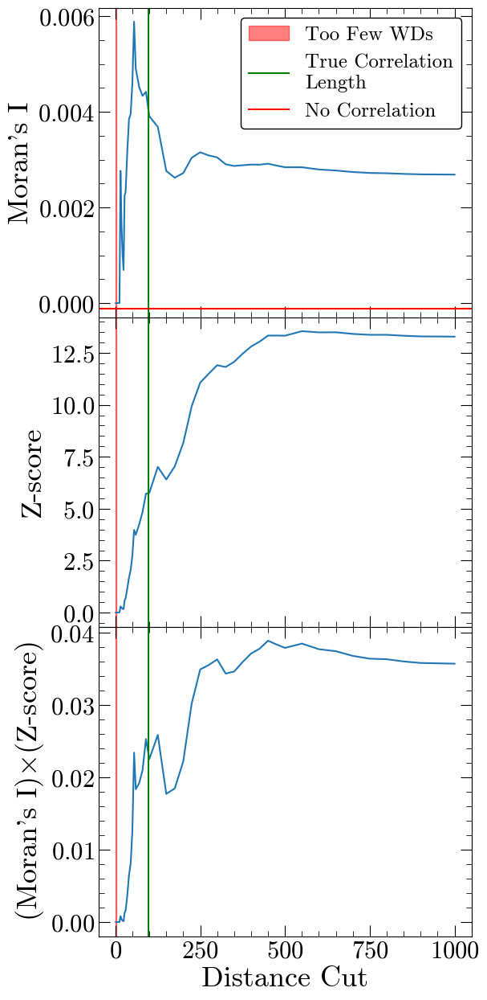

343.05 8.9e-10


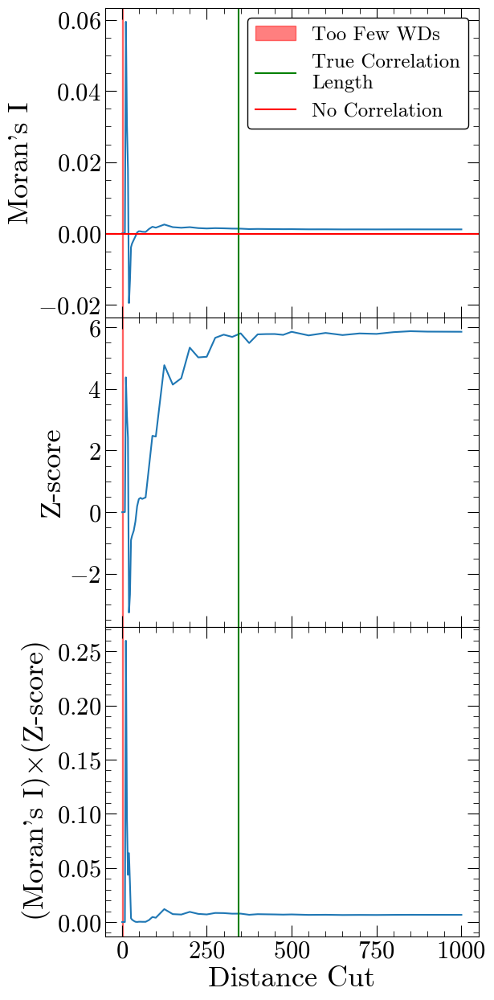

91.31 7e-08


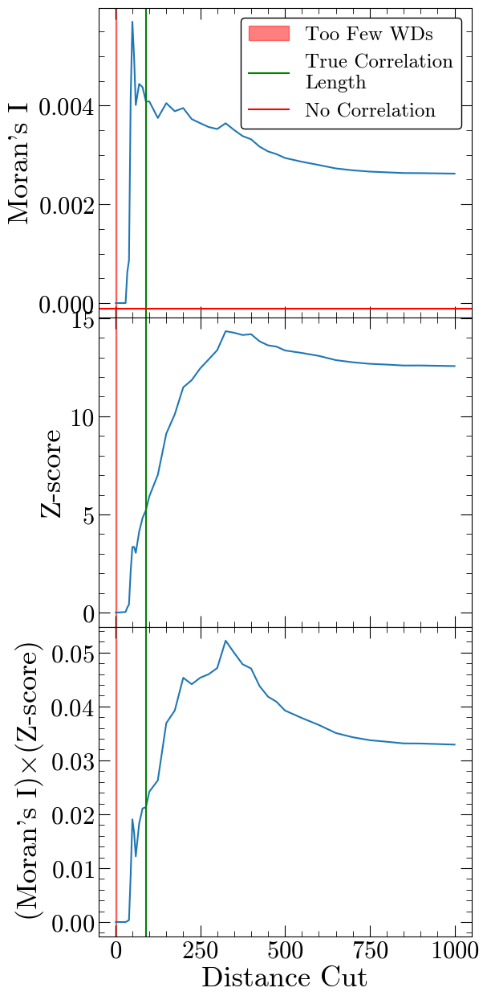

155.57 1e-10


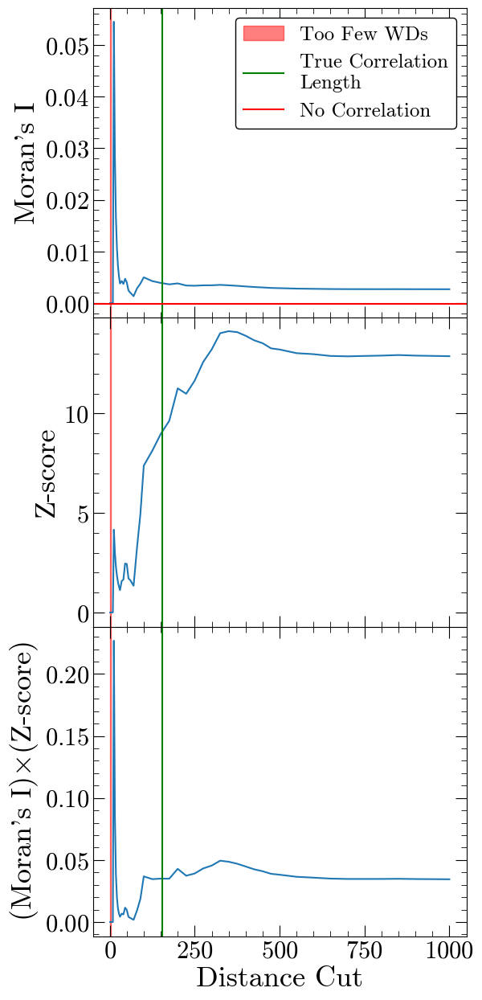

319.93 2.6e-09


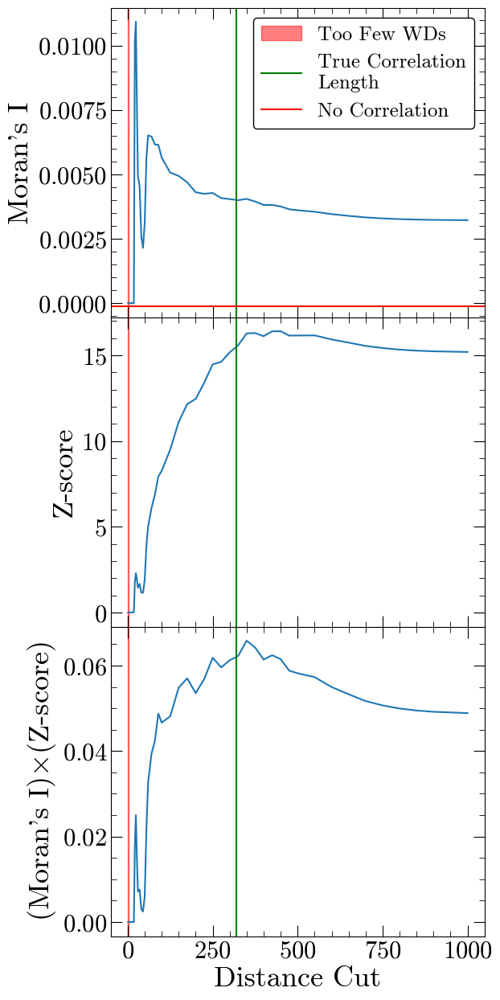

376.49 0.37


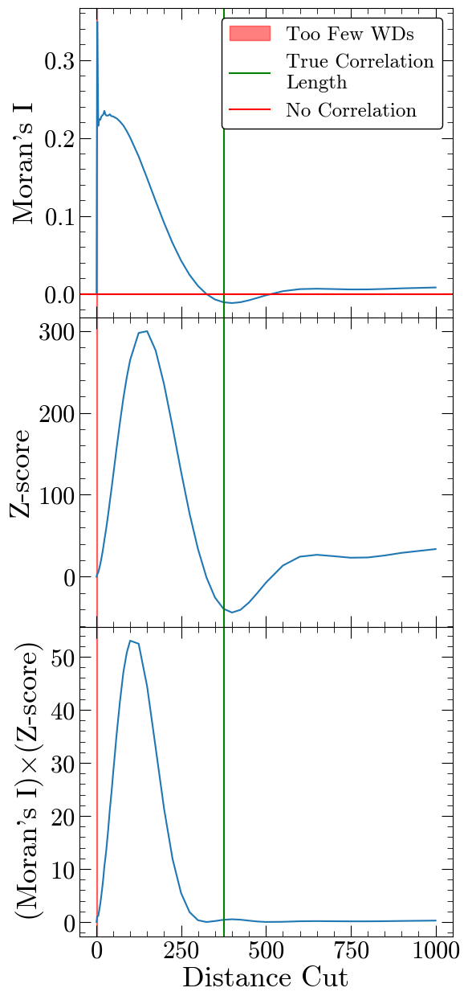

148.5 0.0038


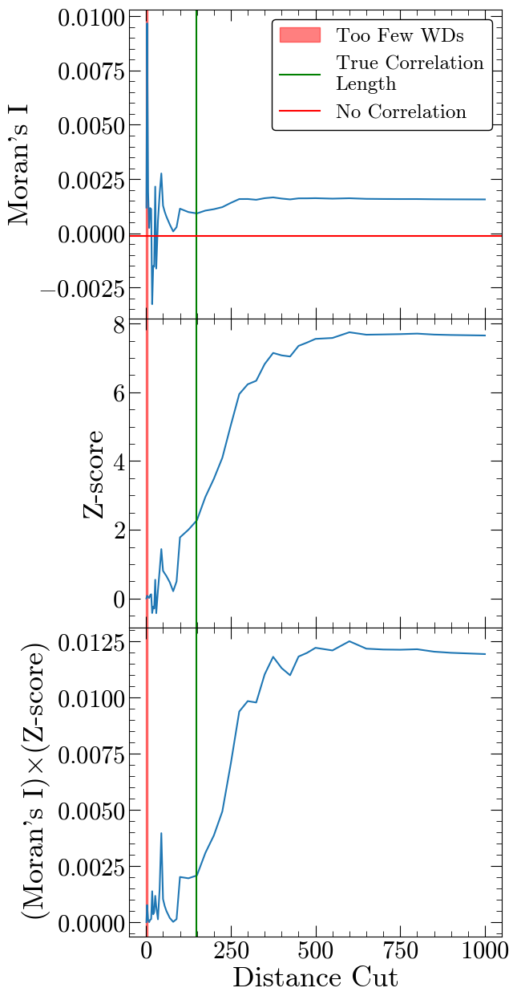

642.81 3e-10


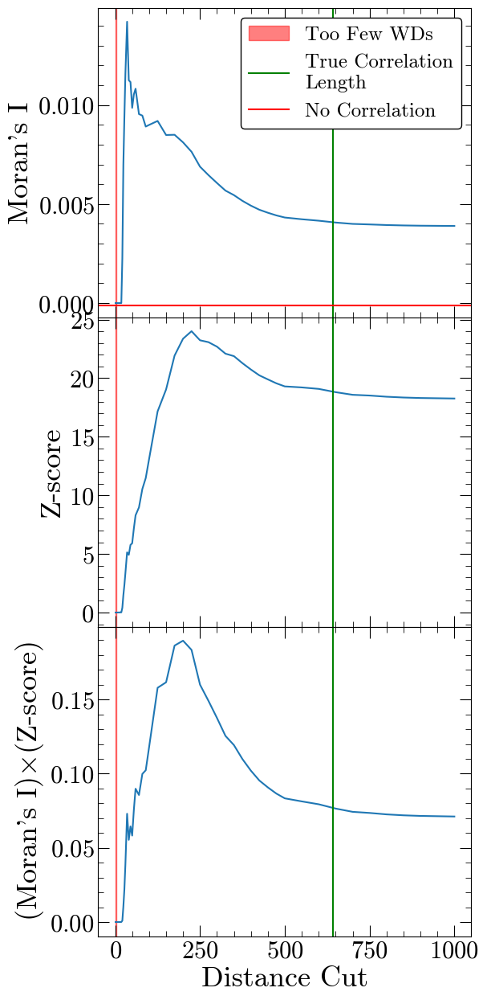

236.45 0.5


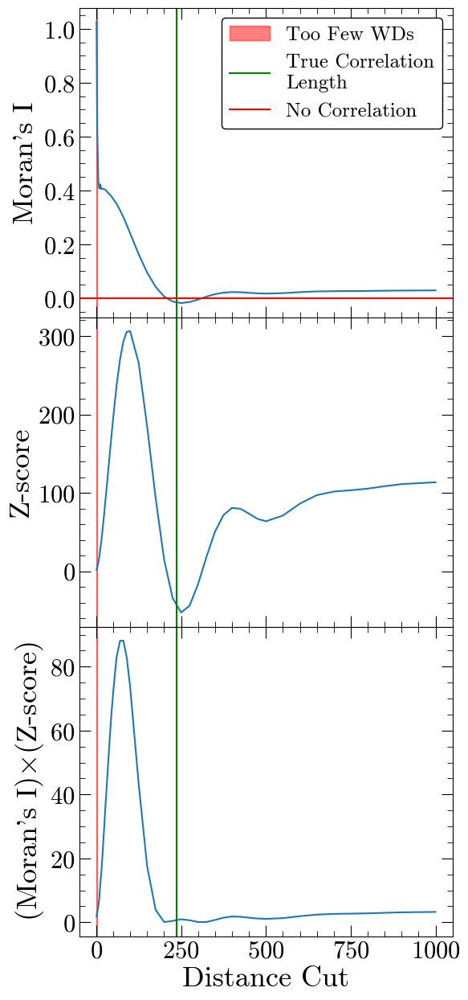

585.7 2.3e-08


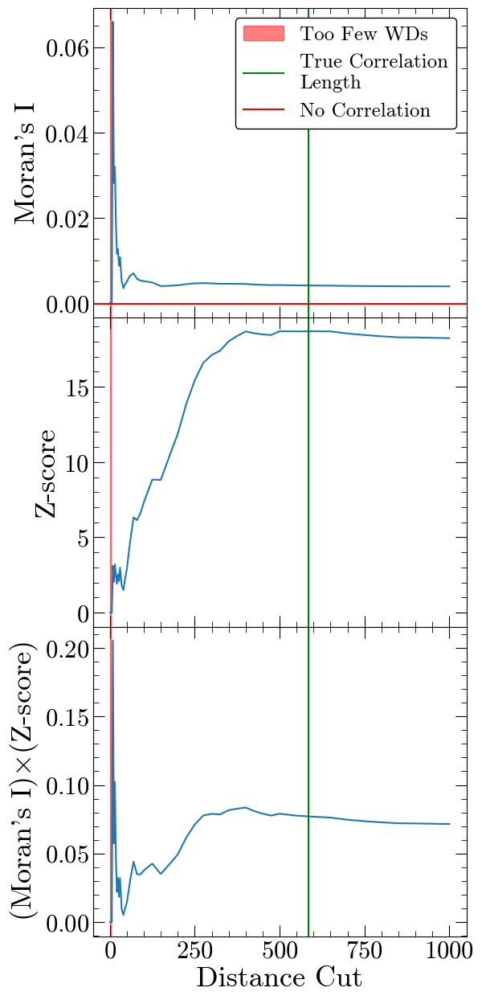

In [6]:
#display a few curves from the training data set
indices=np.random.randint(len(simulation_params_run), size=10)
for index in indices:
    corr_length=simulation_params_run[index][0]
    epsilon=simulation_params_run[index][1]
    print(corr_length,epsilon)
    sample_size=10207
    output=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

# Make a representative plot of various epsilons and correlation lengths

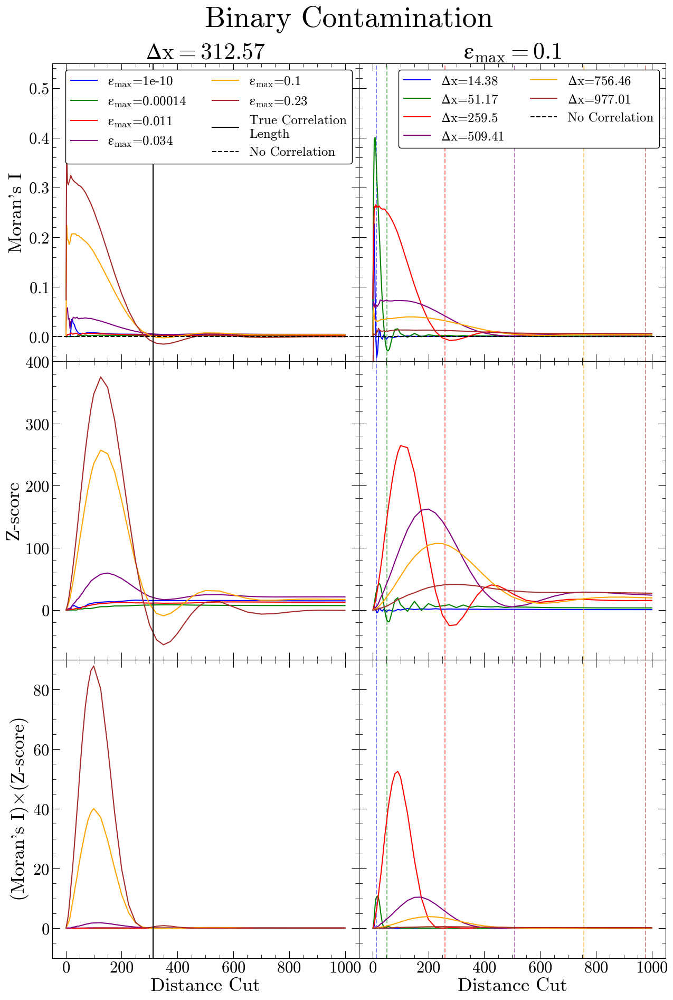

In [7]:
fig, ((ax1,ax4),(ax2,ax5),(ax3,ax6)) = plt.subplots(3,2,figsize=(15,22),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[1e-10,0.00014,0.011,0.034,0.1,0.23]#[1e-10,2.1e-07,0.00014,0.034,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon_{max}$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='upper right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    
#One epsilon length, various correlation lengths
epsilon=0.1
corr_lengths_subset=[14.38, 51.17, 259.5, 509.41, 756.46, 977.01]
for i in range(len(corr_lengths_subset)):
    corr_length=corr_lengths_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax4.plot(final_distances,moransIs,color=color,label='$\Delta x$='+str(corr_length))
    ax4.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax5.plot(final_distances,zscores,color=color)
    ax5.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax6.plot(final_distances,mult,color=color)  
    ax6.axvline(corr_length,color=color,linestyle='--',alpha=0.5)

ax4.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax4.legend(ncol=2,loc='upper right')

ax6.set_xlabel('Distance Cut')

ax4.set_title('$\epsilon_{max}=$'+str(epsilon))

#clean up the plot
ax1.set_ylim(-0.05,0.55)
ax4.set_ylim(-0.05,0.55)

ax2.set_ylim(-80,400)
ax5.set_ylim(-80,400)

ax3.set_ylim(-10,90)
ax6.set_ylim(-10,90)

ax4.set_yticklabels([]) 
ax5.set_yticklabels([]) 
ax6.set_yticklabels([]) 

fig.suptitle('Binary Contamination', fontsize=40, x=0.5, y=0.93)
plt.subplots_adjust(wspace = 0,hspace=0)

plt.savefig('curves_binaries.pdf', dpi=300)#, pad_inches=0.3)

(-0.1, 0.1)

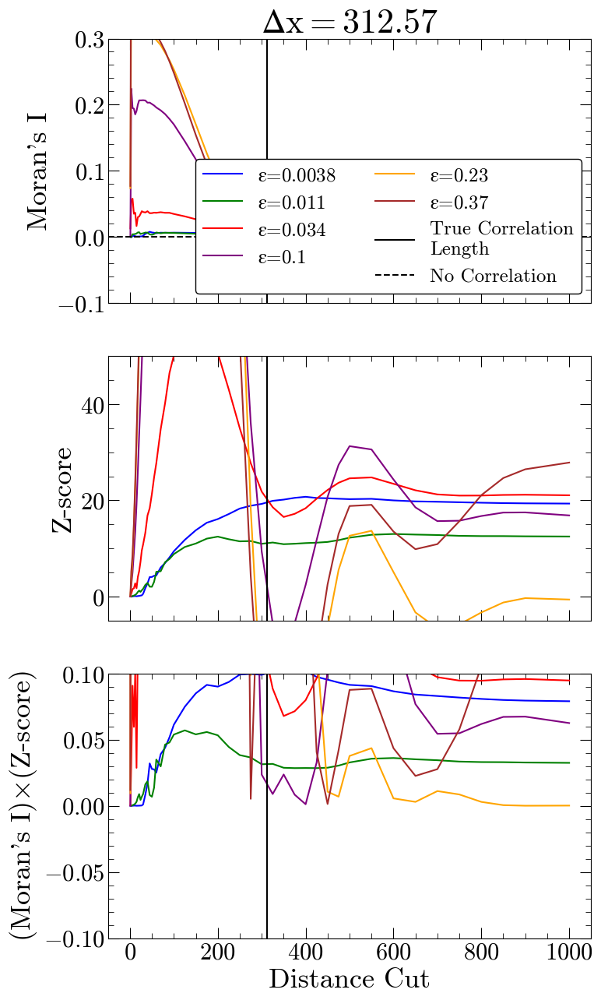

In [8]:
#find minimum visible epsilon

#min=0.011
fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(8,15),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[0.0038,0.011,0.034,0.1,0.23,0.37]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='lower right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    

#clean up the plot
ax1.set_ylim(-0.1,0.3)
ax2.set_ylim(-5,50)
ax3.set_ylim(-.1,.1)


# Set up the training and testing data for the CNN

In [9]:
sample_size=10207

x_train=[]
y_train=[]
ep_train=[]
for simulation in simulation_params_run:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_train.append(normalized)
    #save correlation length as true label
    y_train.append(corr_length)
    #also save epsilon
    ep_train.append(epsilon)
    
x_train=np.array(x_train)
y_train=np.array(y_train)
ep_train=np.array(ep_train)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_train=np.nan_to_num(x_train)

#check for NaNs and Infs
print(np.isnan(x_train).any())
print(np.isinf(x_train).any())

training_data=pd.DataFrame()
training_data['y_true']=y_train
training_data['epsilon']=ep_train

training_data.head()

False
False


,y_true,epsilon
0,4.34,1.000000e-10
1,4.34,3.000000e-10
2,4.34,8.900000e-10
3,4.34,2.600000e-09
4,4.34,7.800000e-09


In [10]:
x_test=[]
y_test=[]
ep_test=[]
for simulation in simulation_params_run_testing:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'testing',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_test.append(normalized)
    #save correlation length as true label
    y_test.append(corr_length)
    #also save epsilon
    ep_test.append(epsilon)
    
x_test=np.array(x_test)
y_test=np.array(y_test)
ep_test=np.array(ep_test)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_test=np.nan_to_num(x_test)

#check for NaNs and Infs
print(np.isnan(x_test).any())
print(np.isinf(x_test).any())

testing_data=pd.DataFrame()
testing_data['y_true']=y_test
testing_data['epsilon']=ep_test

testing_data.head()

False
False


,y_true,epsilon
0,10,1.000000e-10
1,10,1.000000e-07
2,10,1.000000e-04
3,10,1.000000e-03
4,10,5.000000e-03


### Train and Test different CNN configurations

In [28]:
def comparison_stats(data,verbose,success_fit=False,success_fit_threshold=0.1):
    if success_fit:
        init_len=len(data)
        data['abs_frac_err']=np.abs((data['y_true']-data['y_pred'])/data['y_true'])
        data=data.query('abs_frac_err<@success_fit_threshold')
        num_success=len(data)
        #reset the indices
        indices=np.arange(0,len(data))
        data.set_index(indices,inplace=True)
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=num_success/init_len
    else:
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=None
    
    error=y_true-y_pred
    frac_err=error/y_true
    
    #calculate the rmse
    rmse = 0
    for i in range(len(y_true)):
        rmse += (error[i])**2
    rmse = np.sqrt(rmse / len(y_true))
    
    #calculate the median absolute error between the datasets
    mae=np.median(np.abs(error))

    #calculate the bias between the datasets
    bias=np.median(error)
    
    #calculate the median absolute fractional error
    med_frac=np.median(np.abs(frac_err))
    
    if verbose:
        if success_fit:
            print(r'Frac Success Fit: {:2.3f} '.format(frac_success))
        print(r'RMSE: {:2.3f} '.format(rmse)+'pc')
        print(r'MAE: {:2.3f} '.format(mae)+'pc')
        print(r'BIAS: {:2.3f} '.format(bias)+'pc')
        print(r'MED FRAC ERR: {:2.3f} '.format(med_frac))
        
    return(rmse,mae,bias,med_frac,error,frac_err,frac_success)

In [29]:
def comparison_plots(training_data,testing_data,success_fit_threshold=0.1,statx=10,staty=700,statdy=50,lim='default', siegel=True,verbose=True):
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    if verbose:
        print('Training Stats')
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,verbose)
    if verbose:
        print('')
        print('Training Stats, Successful Fits')
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,verbose,True,success_fit_threshold)
    if verbose:
        print('')
        print('Testing Stats')
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,verbose)
    if verbose:
        print('')
        print('Testing Stats, Successful Fits')
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,verbose,True,success_fit_threshold)
    
    stats_df=pd.DataFrame()
    stats_df['mae_training']=[mae_training]
    stats_df['frac_success_training']=[frac_success_training]
    stats_df['mae_testing']=[mae_testing]
    stats_df['frac_success_testing']=[frac_success_testing]
    
    #plot the agreement with stats
    fig, (ax1,ax2) =plt.subplots(1,2,figsize=(16,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
        
    ax2.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax2.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax2.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax2.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax2.legend()
    if lim!='default':
        ax2.set_xlim((lim[0],lim[1]))
        ax2.set_ylim((lim[0],lim[1]))
    ax2.set_yscale('log')
    ax2.set_xscale('log')
    plt.show()
    
    #plot the agreement with trendlines
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    #add a linear trendlines
    if siegel==True:
        coef = stats.siegelslopes(y_pred_testing, y_true_testing)
        poly1d_fn = np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    else:
        coef= np.polyfit(y_true_testing,y_pred_testing,1)
        poly1d_fn= np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    plt.show()

    # plot the fractional error between the datasets
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.legend()
    plt.show()
    
    # plot the fractional error between the datasets
    # again but zoomed in
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.set_ylim((-1,1))
    ax1.legend()
    plt.show()
    
    return(stats_df)
    

In [30]:
#define a function to create the heatmap
def heatmap(data, row_labels, col_labels, ax=None):
    if not ax:
        ax = plt.gca()
        
    # Define color map with custom gradients
    cmap = plt.cm.viridis  # Default, replace with any colormap of your choice
    # Define boundaries for the color ranges
    boundaries = [0, 2, 4, 6, 8, 10, 1000]
    # Define colors corresponding to each range (make sure this matches the number of ranges)
    colors_for_ranges = [
    '#228B22',  # Forest Green
    '#32CD32',  # Lime Green
    '#FFD700',  # Gold (Yellow)
    '#FFA500',  # Orange
    '#FF4500',  # Orange Red
    '#DC143C',  # Crimson
    'black']
    # Create a ListedColormap and BoundaryNorm
    cmap = pltcolors.ListedColormap(colors_for_ranges)
    norm = pltcolors.BoundaryNorm(boundaries, cmap.N)
    
    # Plot the heatmap
    im = ax.imshow(data, cmap=cmap, norm=norm)
    
    #label rows/columns
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_xticklabels(col_labels)#, fontsize=10)
    ax.set_yticks(np.arange(data.shape[0]))
    ax.set_yticklabels(row_labels)
    
    #draw grid lines
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="k", linestyle='-', linewidth=0.5,alpha=0.3)
    ax.tick_params(which="minor", bottom=False, left=False,top=False, right=False)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    return im

def heatmap_testing_data(testing_data,figtitle=None,savefig=False,figname=None):
    data=[]
    failed_fit_region_count=0
    for corr_len in corr_lengths_testing:
        tmp=[]
        for epsilon in epsilons_testing:
            val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
            tmp.append(val)
            if val>10:
                failed_fit_region_count+=1
        data.append(tmp)
    data=np.array(data)
    
    fig,ax0=plt.subplots(1, 1, figsize=(10, 10))
    ylabels=[str(i) for i in corr_lengths_testing]
    xlabels=[str(i) for i in epsilons_testing]
    hm=heatmap(data, ylabels, xlabels, ax=ax0)
    ax0.set_xlabel('$\epsilon$')
    ax0.set_ylabel('$\Delta x_{true}$')
    
    ax0.set_title(figtitle)
    
    #plot colorbar
    cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
    fig.colorbar(hm, cbar_ax)
    cbar_ax.set_ylabel("Absolute Percent Error")#,fontsize=16)
    
    if savefig:
        plt.savefig(figname+'.pdf', dpi=300)
        
    plt.show()
    print('Number of squares with abs percent err>10%, ', failed_fit_region_count)
    
    return(failed_fit_region_count)

In [44]:
def test_model(model,stats=True,plot=True):
    sample_size=10207
    
    # use the model to predict the training data
    y_pred_train = model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the testing data
    y_pred_test = model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold=0.1)
    
    if plot:
        #some runs return NaNs, show those fits
        nan_corr_lengths=testing_data[testing_data['y_pred'].isna()]
        print('')
        print('Showing the '+str(len(nan_corr_lengths))+' curves that returned NaNs')
        display(nan_corr_lengths)
        for i in range(len(nan_corr_lengths)):
            corr_length=nan_corr_lengths['y_true'].to_list()[i]
            epsilon=nan_corr_lengths['epsilon'].to_list()[i]
            output=get_output(corr_length,epsilon,sample_size,'testing',plot=True)

        #show comparison stats and plots
        stats_df=comparison_plots(training_data,testing_data)
        
        #show testing data absolute percent error heatmap
        failed_fit_region_count=heatmap_testing_data(testing_data) 
    else:
        stats_df=None
        nan_corr_lengths='Not saved!'
        failed_fit_region_count=0
        for corr_len in corr_lengths_testing:
            for epsilon in epsilons_testing:
                val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
                if val>10:
                    failed_fit_region_count+=1
    
    if stats:
        return(stats_df)
    else:
        return(failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths)

# Pick models and tune the model hyperparameters

1. **Number of Filters in Convolutional Layers**
   The number of filters (also known as the number of output channels) determines the depth of the feature maps after each convolutional layer.
   **What to try:**
   - You can experiment with **increasing** the number of filters in each layer.
   - Alternatively, **decrease** the number of filters to make the model simpler and see if performance improves.
   
   Keep in mind that increasing the number of filters typically increases the model’s capacity, which can improve performance on more complex tasks but may also lead to overfitting if not properly regularized.

2. **Kernel Size**
   The kernel size defines the window of the convolution. 
   **What to try:**
   - **Larger kernel sizes** (e.g., 5 or 7) might capture broader patterns, which can be useful if the input data has long-range dependencies.
   - **Smaller kernel sizes** (e.g., 1 or 2) might be beneficial if you want to capture very fine-grained features.

3. **Number of Layers**
   The depth of the network can have a significant impact on its performance.
   **What to try:**
   - Adding more **convolutional layers** (e.g., 4 or 5 layers instead of 3) could help the model learn more complex patterns.
   - Alternatively, you can **reduce the number of layers** and see if performance improves, especially if overfitting is a concern.

4. **Pooling Layers**
   Pooling layers help reduce spatial dimensions and retain important features. You're using `MaxPooling1D(2)` after each convolution layer, which is a good starting point.
   **What to try:**
   - **Change the pooling size** (e.g., use `MaxPooling1D(3)` or `MaxPooling1D(4)`).
   - Experiment with different **types of pooling** (e.g., **AveragePooling1D**) to see if it affects performance.

5. **Dense Layer Units**
   In your current model, the final dense layer has 128 units with ReLU activation. The number of units in this layer controls the representational capacity of the fully connected portion of the network.
   **What to try:**
   - You can experiment with **increasing** or **decreasing** the number of units (e.g., try 64 or 256 units).
   - You can also **add another dense layer** between the existing dense layer and the output to increase the model's capacity.

6. **Optimizer and Learning Rate**
   You're using the **Adam optimizer** with its default settings, which is a good default choice for most tasks. However, adjusting the learning rate can have a significant impact on performance.
   **What to try:**
   - **Adjust the learning rate** (e.g., `learning_rate=0.001`, `learning_rate=0.0005`, `learning_rate=0.0001`).
   - You could also experiment with **different optimizers** (e.g., **SGD**, **RMSprop**) to see if they improve convergence speed or final accuracy.

7. **Batch Size**
   The batch size you’re currently using is 32, which is a standard choice.
   **What to try:**
   - Experiment with **larger batch sizes** (e.g., 64 or 128) to speed up training, or **smaller batch sizes** (e.g., 16 or 8) if you believe that could help the model generalize better.
   - Smaller batch sizes can help avoid local minima, while larger batch sizes usually converge faster.

8. **Regularization (Dropout or L2 Regularization)**
   You’re not using any regularization at the moment, which may cause overfitting, especially with a deep model.
   **What to try:**
   - **Dropout**: Add `Dropout` layers after the convolutional or dense layers to help prevent overfitting. Try dropout rates between 0.2 and 0.5.
   - **L2 Regularization**: Add L2 regularization to your layers, which helps penalize large weights and reduces overfitting. Example: `kernel_regularizer=l2(0.01)`.

9. **Activation Function**
   You're using ReLU as the activation function for all layers, which is quite common.
   **What to try:**
   - Experiment with different **activation functions** for the hidden layers, such as **LeakyReLU**, **ELU**, or **SELU**.
   - For the output layer, if you're predicting a continuous variable (since you're using `mse` loss), you may want to use a **linear activation** (which is the default for `Dense(1)`).


Epoch 1/100
92/92 [==============================] - 0s 3ms/step - loss: 112670.9453
Epoch 2/100
92/92 [==============================] - 0s 3ms/step - loss: 67647.3438
Epoch 3/100
92/92 [==============================] - 0s 3ms/step - loss: 66649.6094
Epoch 4/100
92/92 [==============================] - 0s 3ms/step - loss: 66088.0078
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 65603.6641
Epoch 6/100
92/92 [==============================] - 0s 3ms/step - loss: 65349.3516
Epoch 7/100
92/92 [==============================] - 0s 3ms/step - loss: 64467.7031
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 64055.6094
Epoch 9/100
92/92 [==============================] - 0s 3ms/step - loss: 63568.7461
Epoch 10/100
92/92 [==============================] - 0s 3ms/step - loss: 62667.2461
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 62091.0039
Epoch 12/100
92/92 [==============================] - 0s 3ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 233.619 pc
MAE: 158.694 pc
BIAS: -38.160 pc
MED FRAC ERR: 0.510 

Training Stats, Successful Fits
Frac Success Fit: 0.150 
RMSE: 21.025 pc
MAE: 13.889 pc
BIAS: -3.712 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 224.268 pc
MAE: 74.645 pc
BIAS: -11.786 pc
MED FRAC ERR: 0.227 

Testing Stats, Successful Fits
Frac Success Fit: 0.297 
RMSE: 25.258 pc
MAE: 15.121 pc
BIAS: -3.595 pc
MED FRAC ERR: 0.042 


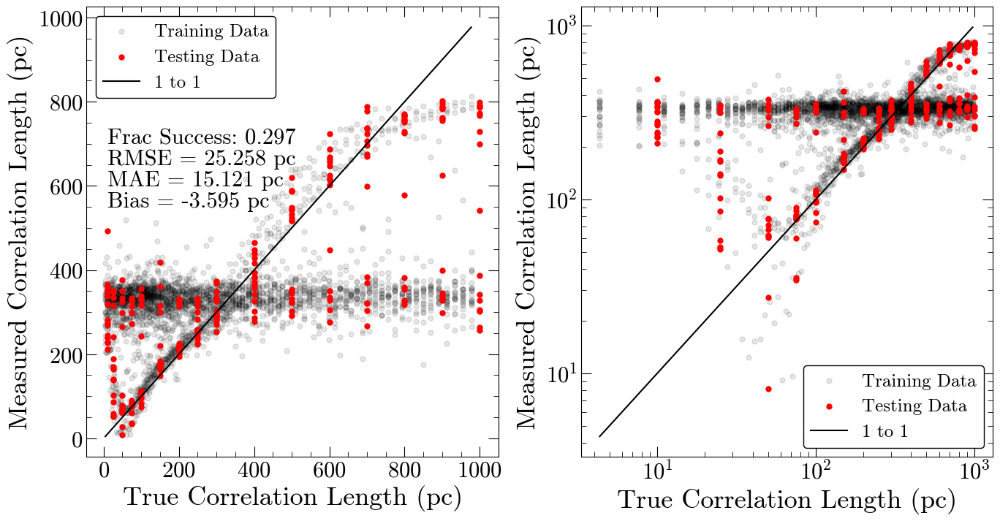

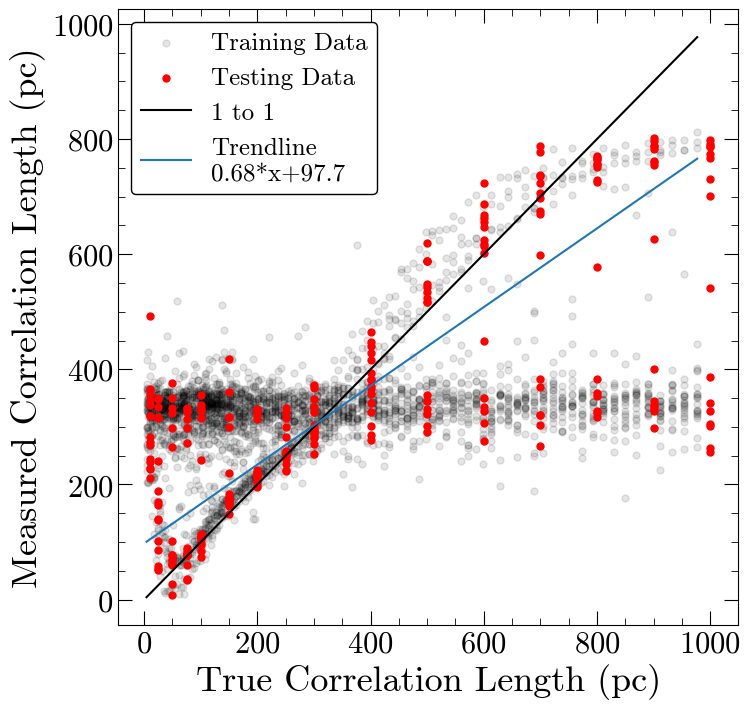

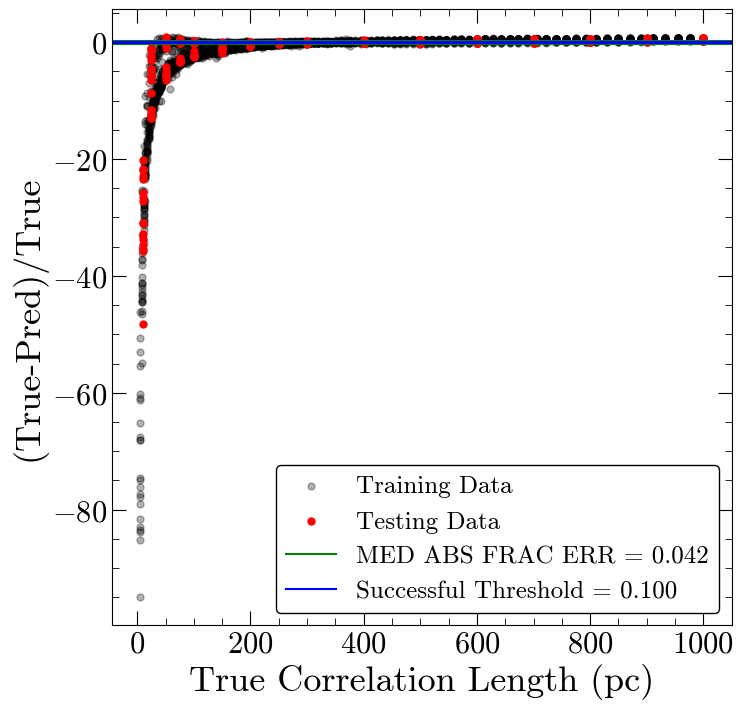

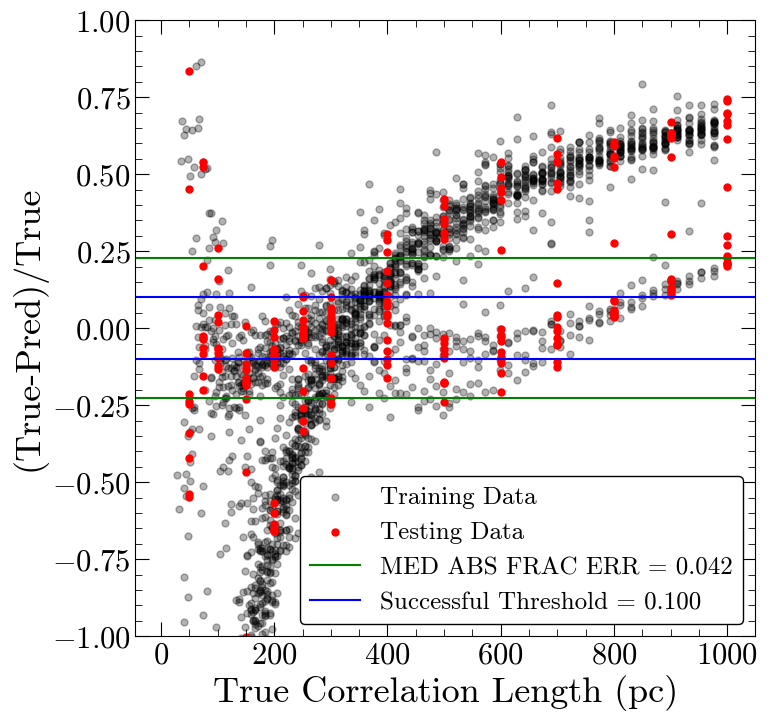

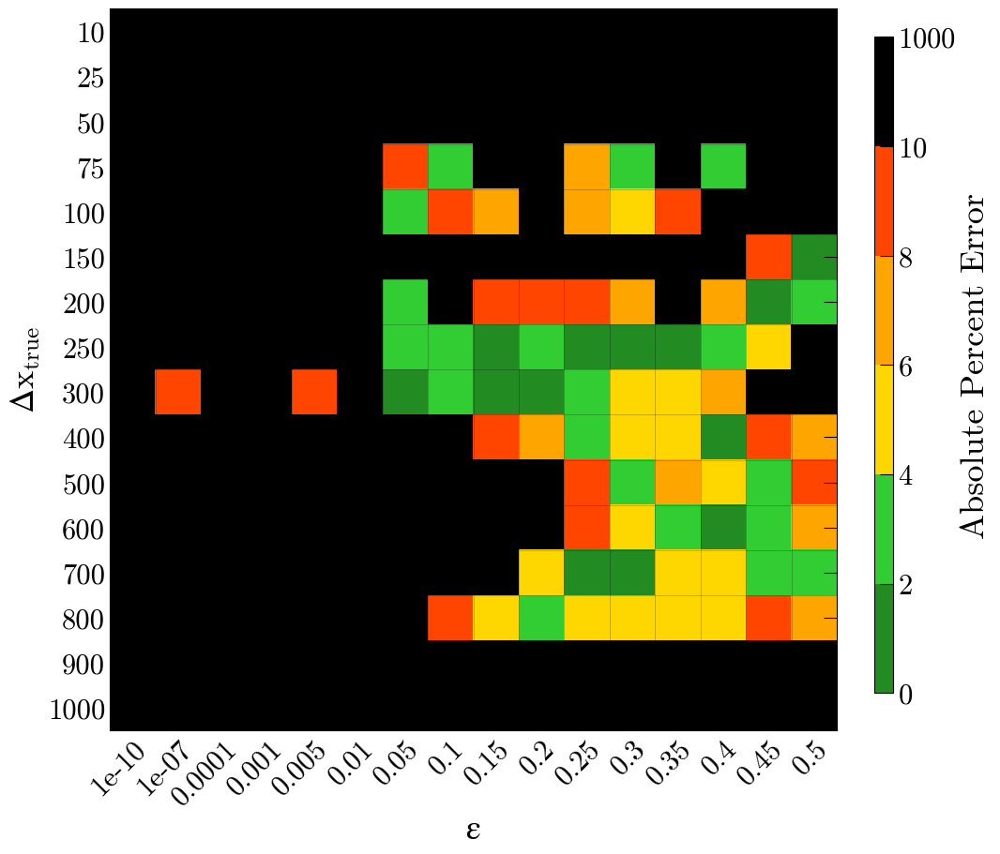

Number of squares with abs percent err>10%,  180


In [32]:
#simple model
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats for all models to compare and find best model
all_model_stats=output

Epoch 1/200
92/92 [==============================] - 0s 3ms/step - loss: 111670.3516
Epoch 2/200
92/92 [==============================] - 0s 4ms/step - loss: 68639.2109
Epoch 3/200
92/92 [==============================] - 0s 4ms/step - loss: 66945.9141
Epoch 4/200
92/92 [==============================] - 0s 4ms/step - loss: 66121.6562
Epoch 5/200
92/92 [==============================] - 0s 4ms/step - loss: 65167.4375
Epoch 6/200
92/92 [==============================] - 0s 5ms/step - loss: 64383.6172
Epoch 7/200
92/92 [==============================] - 0s 5ms/step - loss: 63229.6562
Epoch 8/200
92/92 [==============================] - 0s 5ms/step - loss: 62566.8789
Epoch 9/200
92/92 [==============================] - 0s 5ms/step - loss: 61407.1836
Epoch 10/200
92/92 [==============================] - 0s 4ms/step - loss: 61113.0430
Epoch 11/200
92/92 [==============================] - 0s 5ms/step - loss: 60499.2812
Epoch 12/200
92/92 [==============================] - 0s 4ms/step - loss:

92/92 [==============================] - 1s 8ms/step - loss: 53145.2188
Epoch 193/200
92/92 [==============================] - 1s 7ms/step - loss: 53203.7344
Epoch 194/200
92/92 [==============================] - 1s 9ms/step - loss: 53114.9648
Epoch 195/200
92/92 [==============================] - 1s 8ms/step - loss: 53416.9336
Epoch 196/200
92/92 [==============================] - 1s 9ms/step - loss: 53560.6328
Epoch 197/200
92/92 [==============================] - 1s 8ms/step - loss: 53052.0078
Epoch 198/200
92/92 [==============================] - 1s 7ms/step - loss: 53199.6992
Epoch 199/200
92/92 [==============================] - 1s 8ms/step - loss: 53334.6055
Epoch 200/200
92/92 [==============================] - 1s 9ms/step - loss: 53059.9102

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 230.292 pc
MAE: 139.423 pc
BIAS: -4.997 pc
MED FRAC ERR: 0.495 

Training Stats, Successful Fits
Frac Success Fit: 0.191 
RMSE: 21.851 pc
MAE: 11.629 pc
BIAS: 5.492 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 217.564 pc
MAE: 50.449 pc
BIAS: 12.447 pc
MED FRAC ERR: 0.178 

Testing Stats, Successful Fits
Frac Success Fit: 0.387 
RMSE: 27.019 pc
MAE: 12.671 pc
BIAS: 9.169 pc
MED FRAC ERR: 0.046 


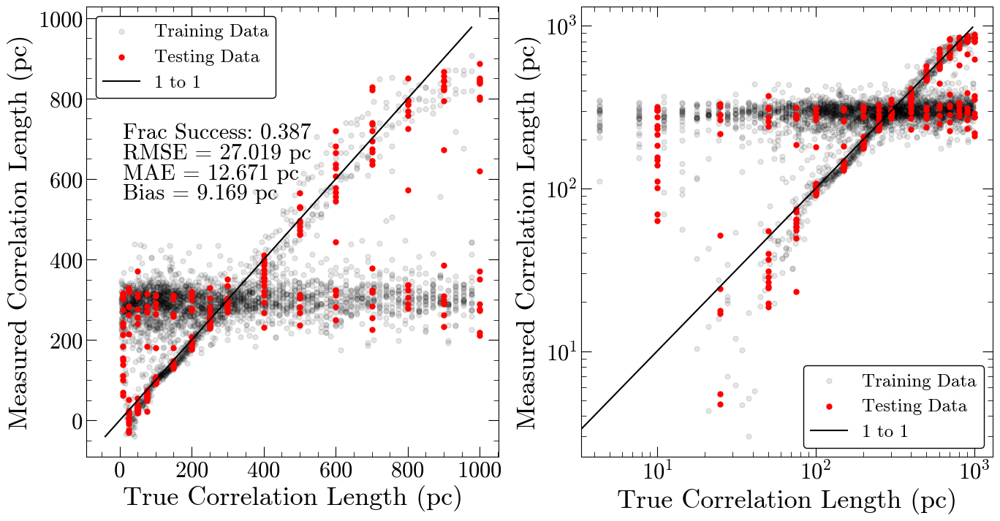

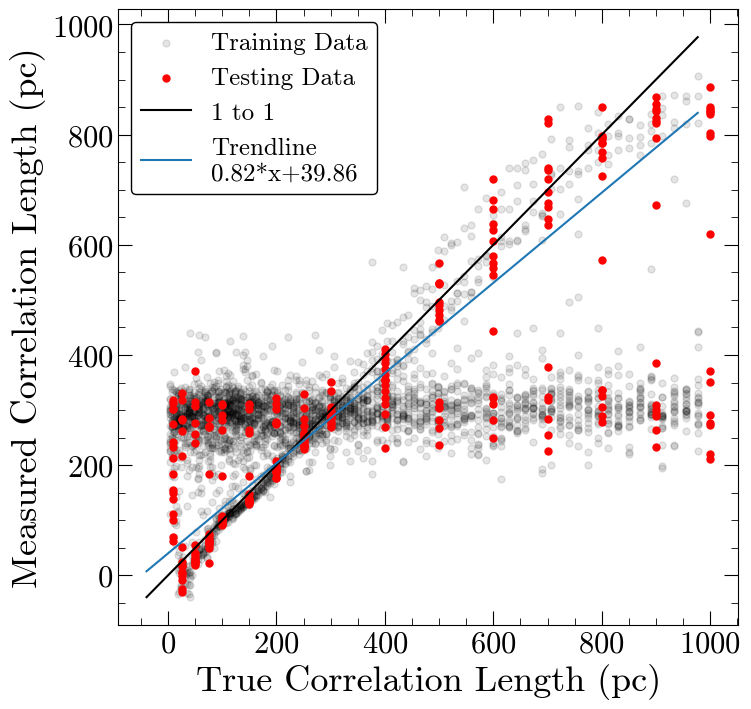

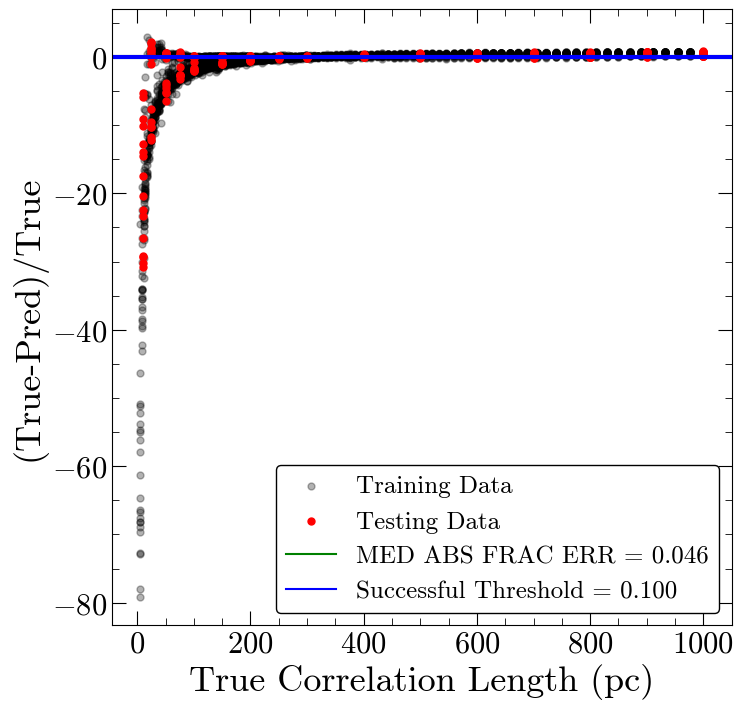

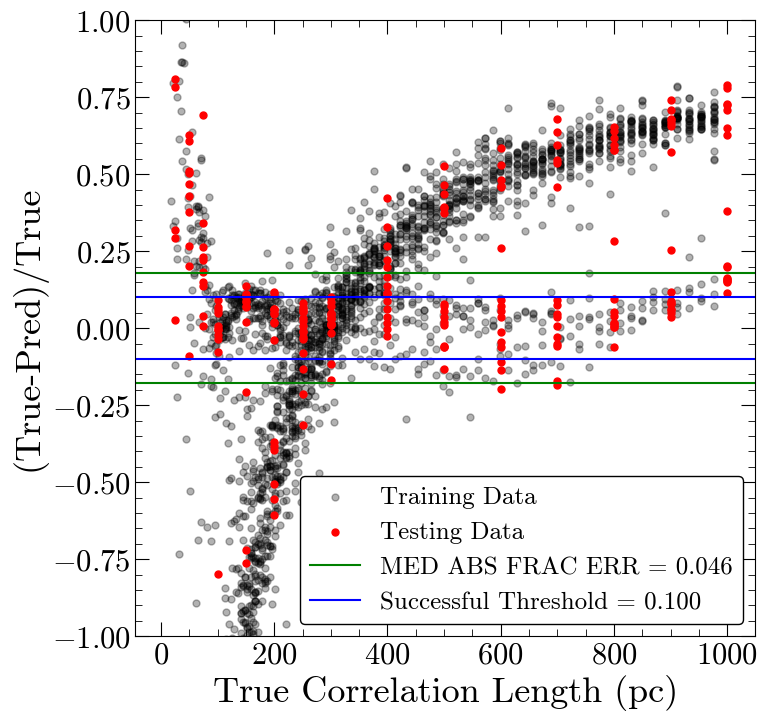

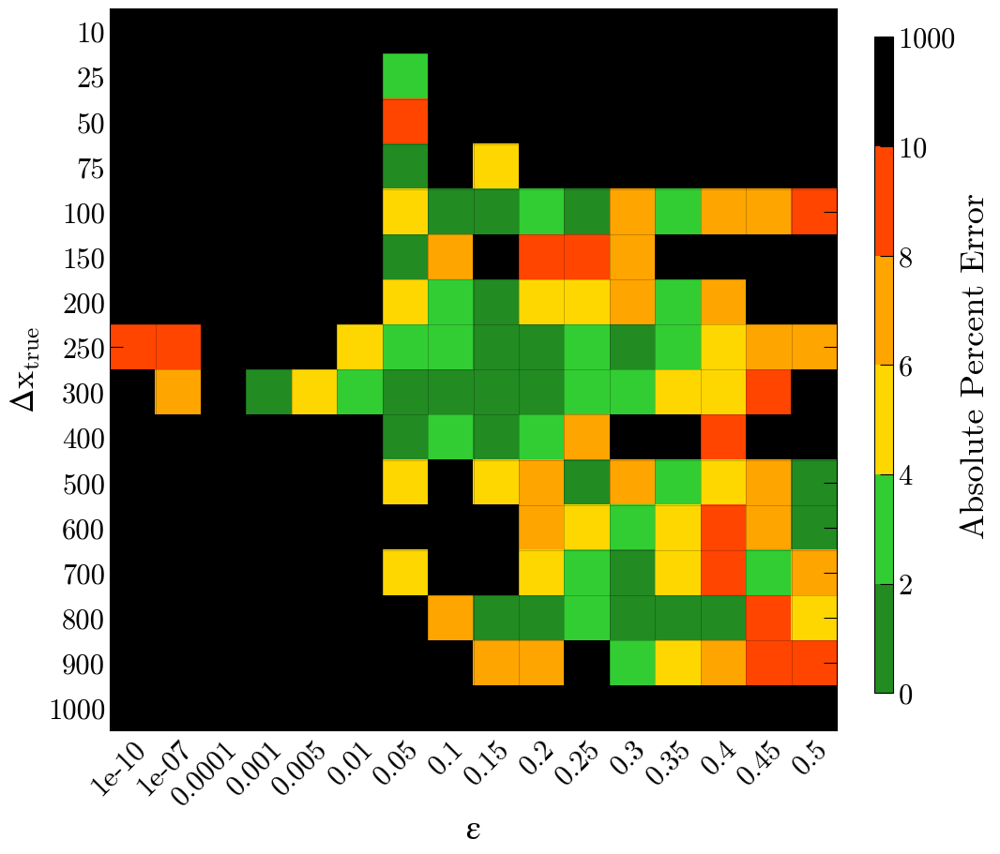

Number of squares with abs percent err>10%,  157


In [33]:
#simple model, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 2s 9ms/step - loss: 99710.9609
Epoch 2/100
92/92 [==============================] - 1s 9ms/step - loss: 66801.6562
Epoch 3/100
92/92 [==============================] - 1s 7ms/step - loss: 66524.1250
Epoch 4/100
92/92 [==============================] - 1s 8ms/step - loss: 65357.0859
Epoch 5/100
92/92 [==============================] - 1s 7ms/step - loss: 64792.9766
Epoch 6/100
92/92 [==============================] - 1s 8ms/step - loss: 63569.7656
Epoch 7/100
92/92 [==============================] - 1s 10ms/step - loss: 61948.4062
Epoch 8/100
92/92 [==============================] - 1s 9ms/step - loss: 59771.7656
Epoch 9/100
92/92 [==============================] - 1s 8ms/step - loss: 58589.6406
Epoch 10/100
92/92 [==============================] - 1s 8ms/step - loss: 58639.8516
Epoch 11/100
92/92 [==============================] - 1s 8ms/step - loss: 57893.4375
Epoch 12/100
92/92 [==============================] - 1s 8ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 228.353 pc
MAE: 143.106 pc
BIAS: -14.485 pc
MED FRAC ERR: 0.491 

Training Stats, Successful Fits
Frac Success Fit: 0.193 
RMSE: 21.405 pc
MAE: 11.962 pc
BIAS: 3.447 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 227.565 pc
MAE: 55.937 pc
BIAS: 4.796 pc
MED FRAC ERR: 0.154 

Testing Stats, Successful Fits
Frac Success Fit: 0.398 
RMSE: 27.203 pc
MAE: 11.945 pc
BIAS: 3.575 pc
MED FRAC ERR: 0.044 


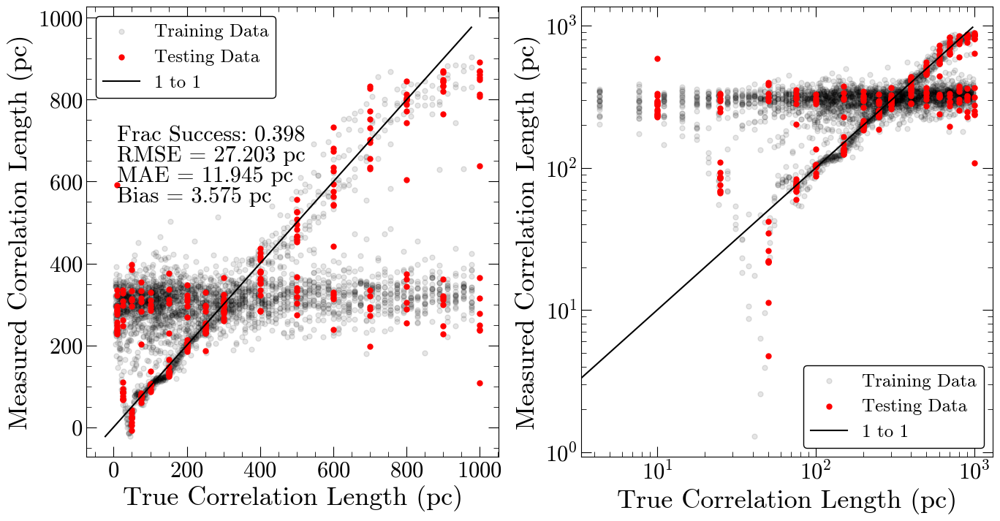

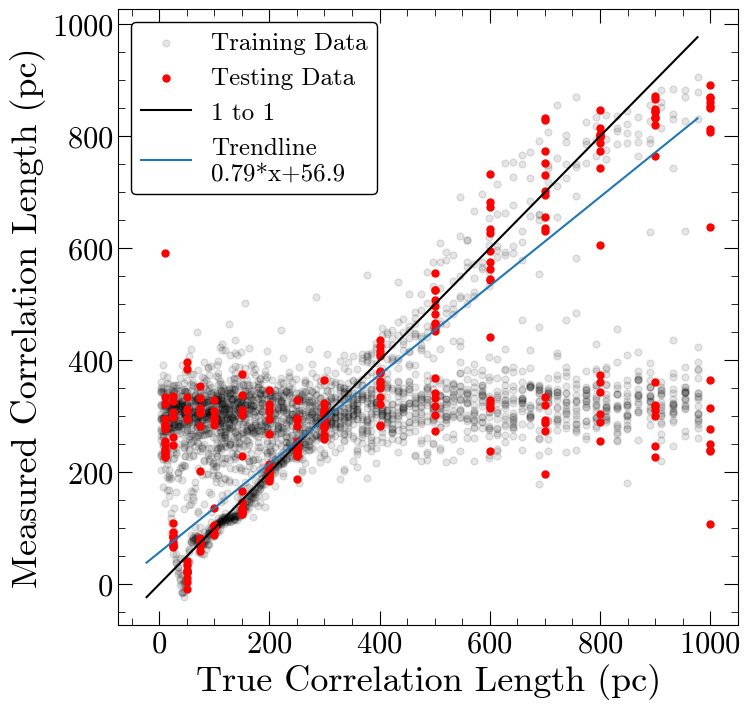

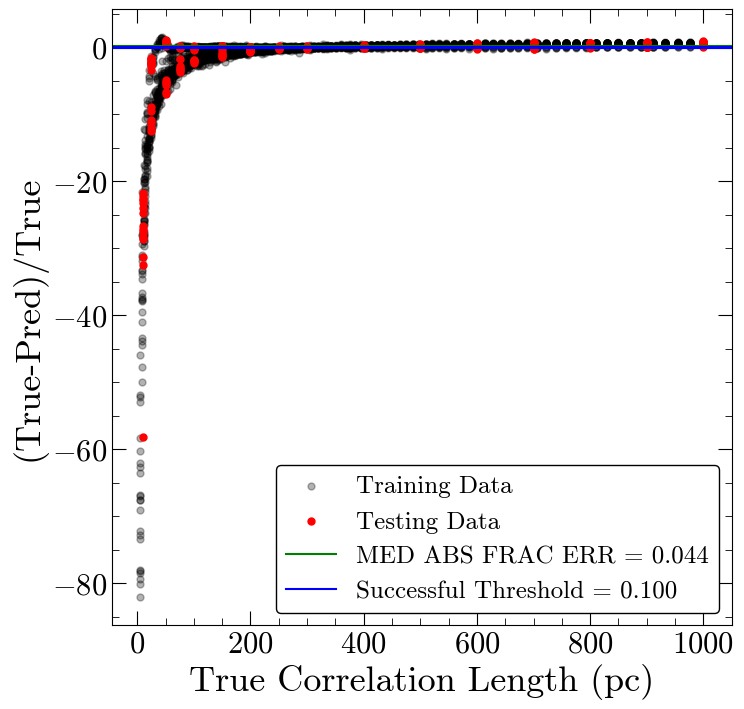

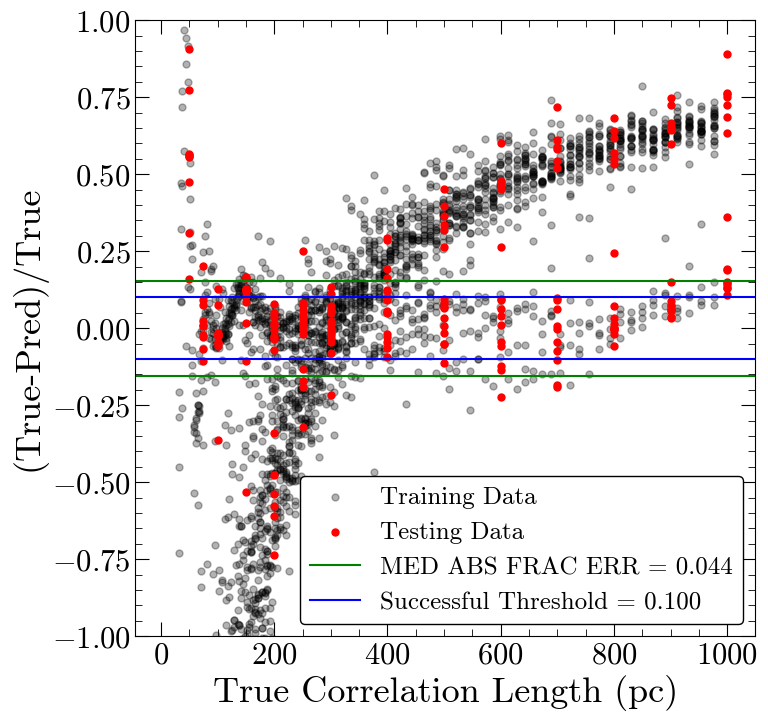

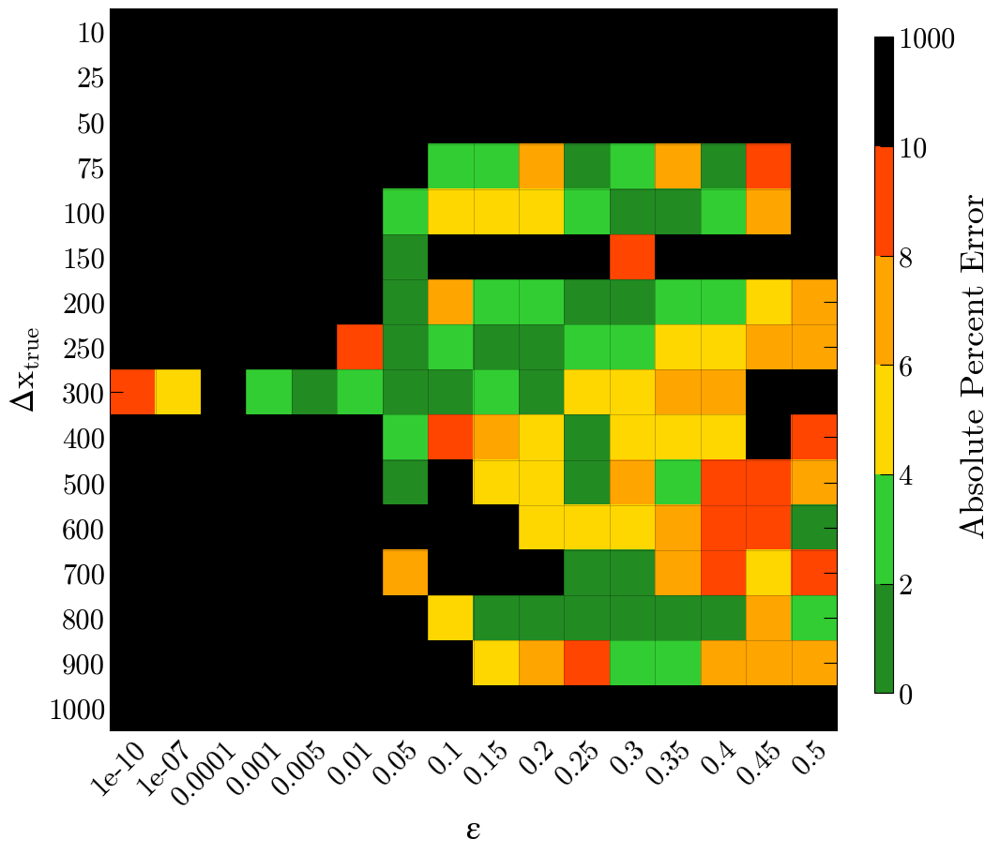

Number of squares with abs percent err>10%,  154


In [34]:
#model with more layers
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 2s 12ms/step - loss: 96967.2891
Epoch 2/200
92/92 [==============================] - 1s 10ms/step - loss: 67554.4219
Epoch 3/200
92/92 [==============================] - 1s 9ms/step - loss: 67162.5000
Epoch 4/200
92/92 [==============================] - 1s 9ms/step - loss: 65670.9531
Epoch 5/200
92/92 [==============================] - 1s 9ms/step - loss: 65400.1875
Epoch 6/200
92/92 [==============================] - 1s 10ms/step - loss: 64538.8438
Epoch 7/200
92/92 [==============================] - 1s 9ms/step - loss: 63940.8984
Epoch 8/200
92/92 [==============================] - 1s 9ms/step - loss: 62706.6523
Epoch 9/200
92/92 [==============================] - 1s 9ms/step - loss: 61431.4531
Epoch 10/200
92/92 [==============================] - 1s 12ms/step - loss: 59564.3281
Epoch 11/200
92/92 [==============================] - 1s 11ms/step - loss: 58393.4766
Epoch 12/200
92/92 [==============================] - 1s 10ms/step - 

92/92 [==============================] - 1s 10ms/step - loss: 41771.2344
Epoch 191/200
92/92 [==============================] - 1s 11ms/step - loss: 41363.4609
Epoch 192/200
92/92 [==============================] - 1s 13ms/step - loss: 40937.5898
Epoch 193/200
92/92 [==============================] - 1s 12ms/step - loss: 40542.2227
Epoch 194/200
92/92 [==============================] - 1s 13ms/step - loss: 40468.9609
Epoch 195/200
92/92 [==============================] - 1s 12ms/step - loss: 40627.3633
Epoch 196/200
92/92 [==============================] - 1s 12ms/step - loss: 40094.4492
Epoch 197/200
92/92 [==============================] - 1s 12ms/step - loss: 39276.6484
Epoch 198/200
92/92 [==============================] - 1s 10ms/step - loss: 39269.8711
Epoch 199/200
92/92 [==============================] - 1s 15ms/step - loss: 38884.2734
Epoch 200/200
92/92 [==============================] - 1s 11ms/step - loss: 39686.1133

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 192.454 pc
MAE: 110.473 pc
BIAS: -19.937 pc
MED FRAC ERR: 0.382 

Training Stats, Successful Fits
Frac Success Fit: 0.205 
RMSE: 22.870 pc
MAE: 13.108 pc
BIAS: 2.825 pc
MED FRAC ERR: 0.049 

Testing Stats
RMSE: 219.257 pc
MAE: 37.448 pc
BIAS: -2.028 pc
MED FRAC ERR: 0.158 

Testing Stats, Successful Fits
Frac Success Fit: 0.375 
RMSE: 24.922 pc
MAE: 12.658 pc
BIAS: 4.208 pc
MED FRAC ERR: 0.036 


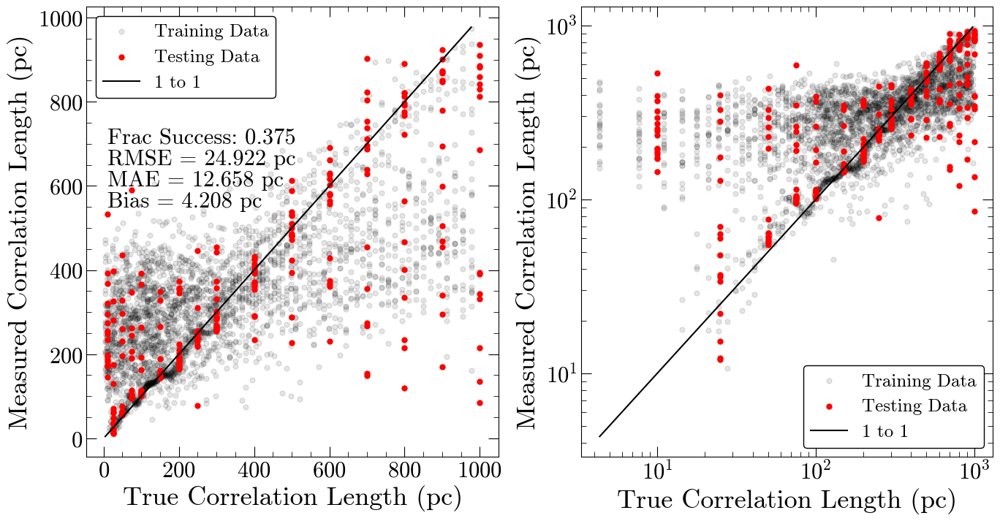

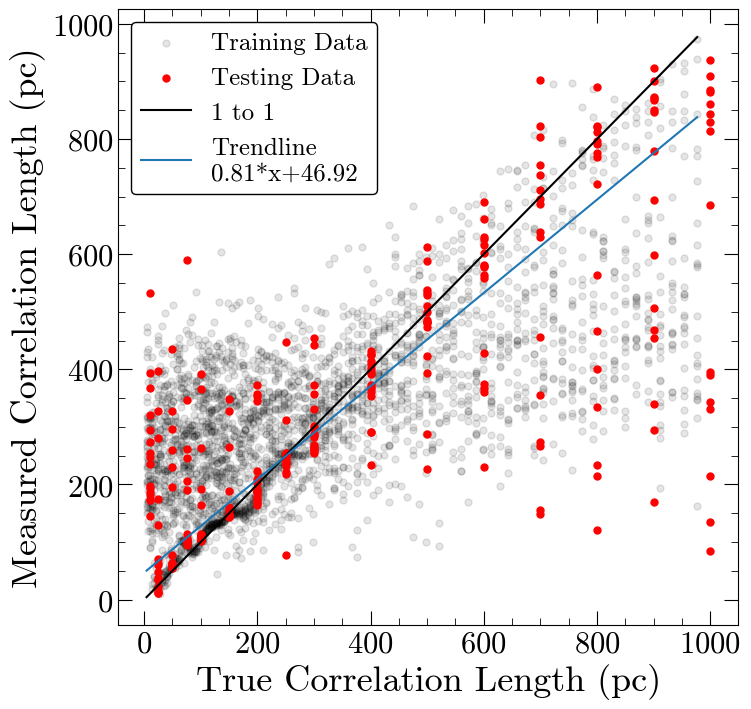

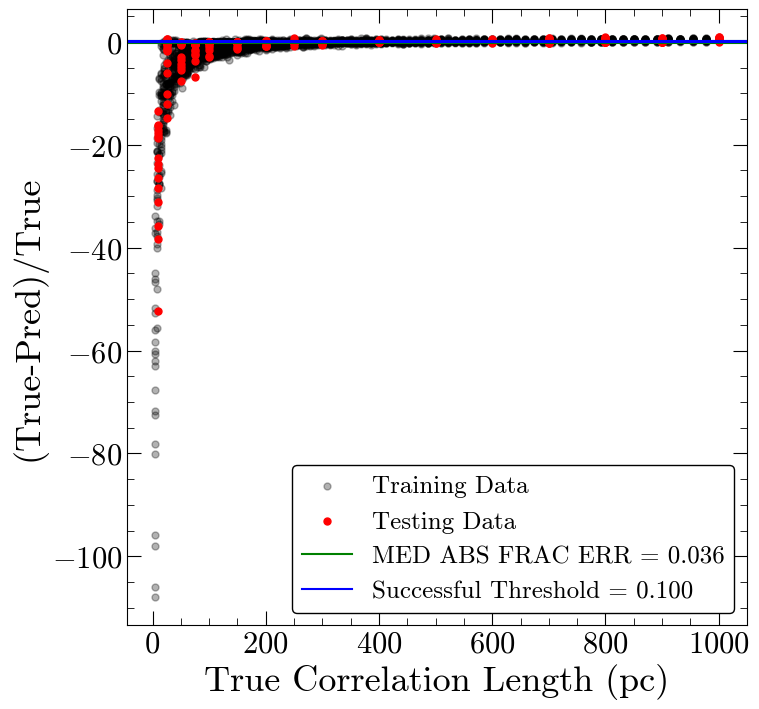

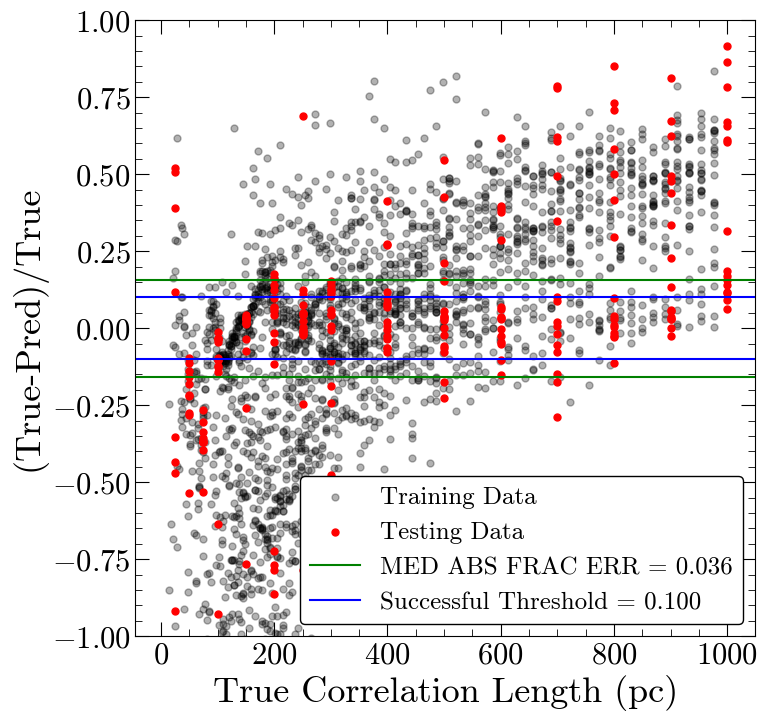

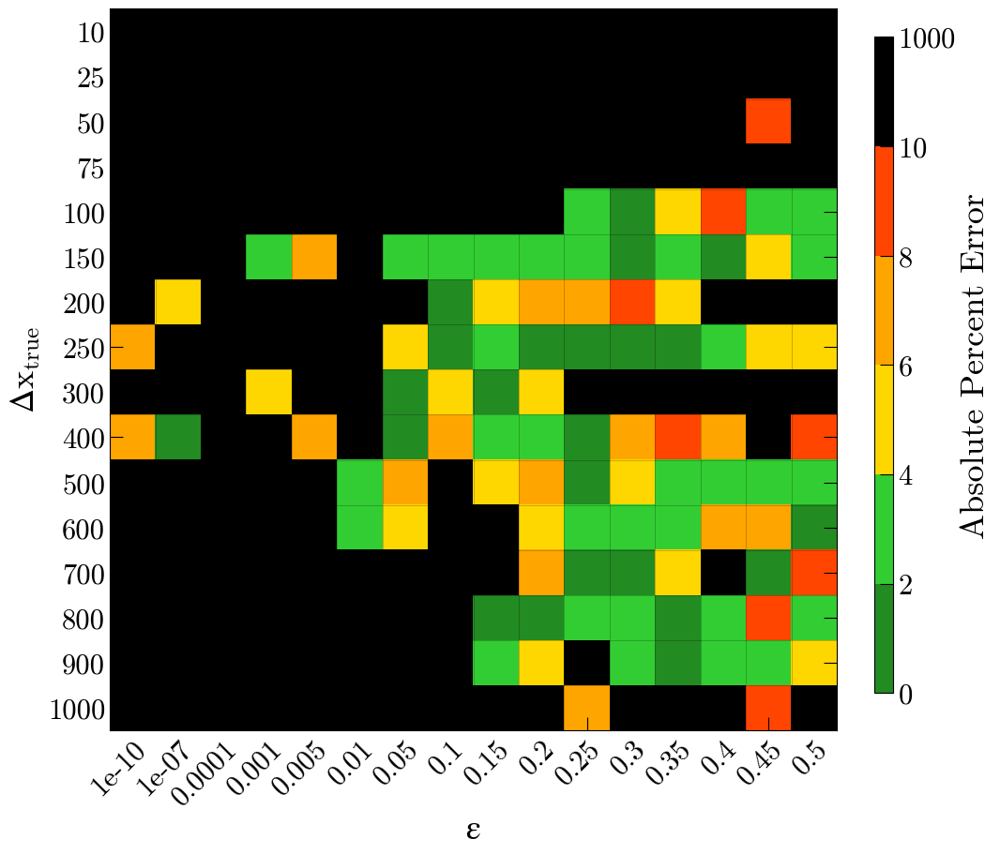

Number of squares with abs percent err>10%,  160


In [35]:
#model with more layers, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 10ms/step - loss: 97230.6797
Epoch 2/100
92/92 [==============================] - 1s 9ms/step - loss: 66716.1953
Epoch 3/100
92/92 [==============================] - 1s 10ms/step - loss: 65645.9531
Epoch 4/100
92/92 [==============================] - 1s 13ms/step - loss: 65484.1914
Epoch 5/100
92/92 [==============================] - 1s 9ms/step - loss: 65198.2734
Epoch 6/100
92/92 [==============================] - 1s 9ms/step - loss: 65217.6758
Epoch 7/100
92/92 [==============================] - 1s 10ms/step - loss: 64090.9219
Epoch 8/100
92/92 [==============================] - 1s 11ms/step - loss: 63406.5000
Epoch 9/100
92/92 [==============================] - 1s 10ms/step - loss: 61118.6094
Epoch 10/100
92/92 [==============================] - 1s 13ms/step - loss: 60034.8477
Epoch 11/100
92/92 [==============================] - 1s 12ms/step - loss: 58588.0000
Epoch 12/100
92/92 [==============================] - 1s 9ms/step 

Epoch 97/100
92/92 [==============================] - 1s 9ms/step - loss: 51611.7969
Epoch 98/100
92/92 [==============================] - 1s 8ms/step - loss: 51719.3008
Epoch 99/100
92/92 [==============================] - 1s 9ms/step - loss: 51406.2305
Epoch 100/100
92/92 [==============================] - 1s 8ms/step - loss: 51653.8047

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 226.168 pc
MAE: 143.897 pc
BIAS: -16.636 pc
MED FRAC ERR: 0.467 

Training Stats, Successful Fits
Frac Success Fit: 0.190 
RMSE: 21.068 pc
MAE: 10.452 pc
BIAS: 1.973 pc
MED FRAC ERR: 0.041 

Testing Stats
RMSE: 219.742 pc
MAE: 55.665 pc
BIAS: 4.674 pc
MED FRAC ERR: 0.180 

Testing Stats, Successful Fits
Frac Success Fit: 0.367 
RMSE: 28.293 pc
MAE: 12.851 pc
BIAS: 5.180 pc
MED FRAC ERR: 0.042 


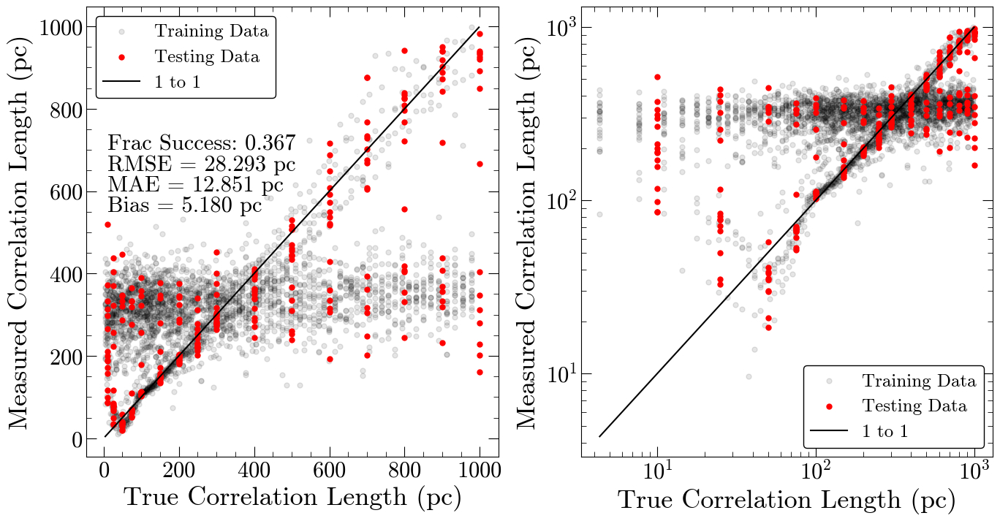

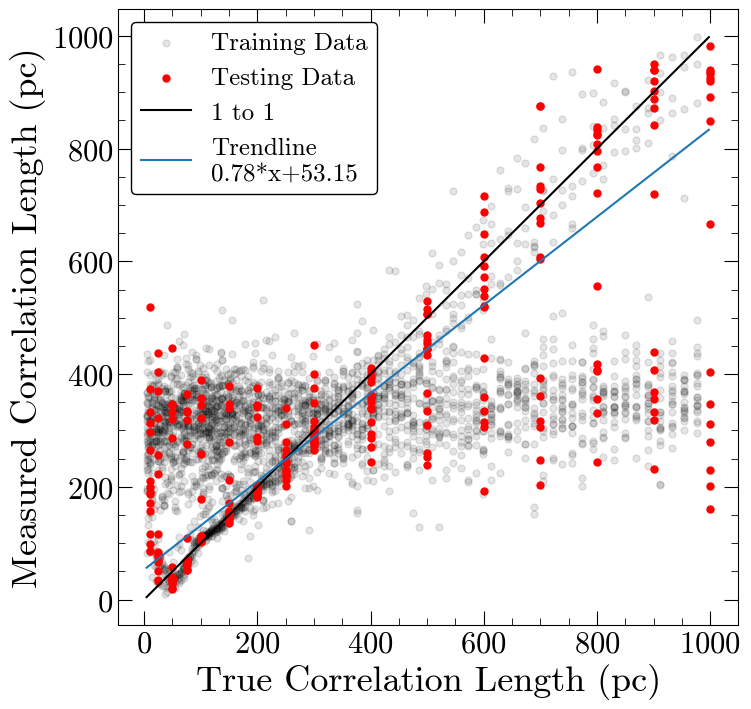

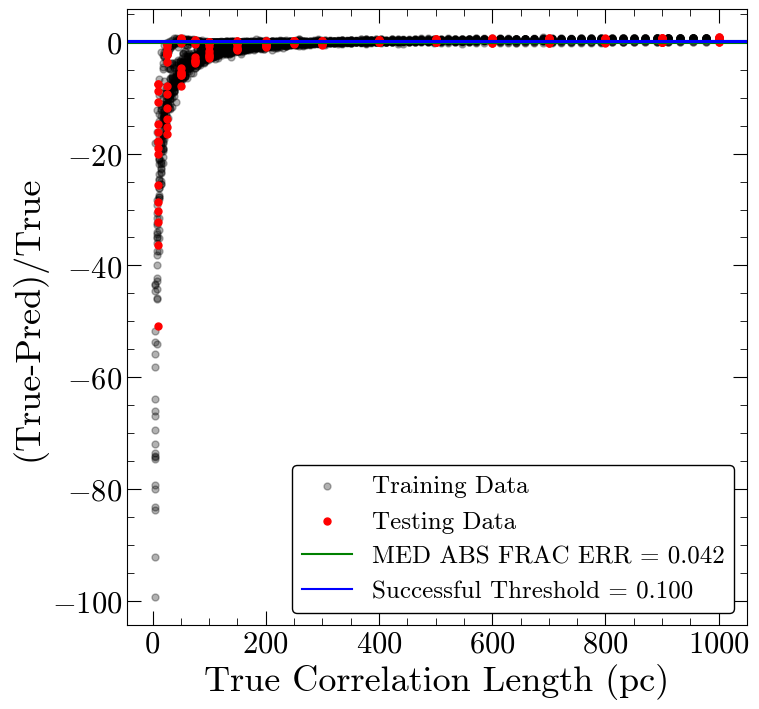

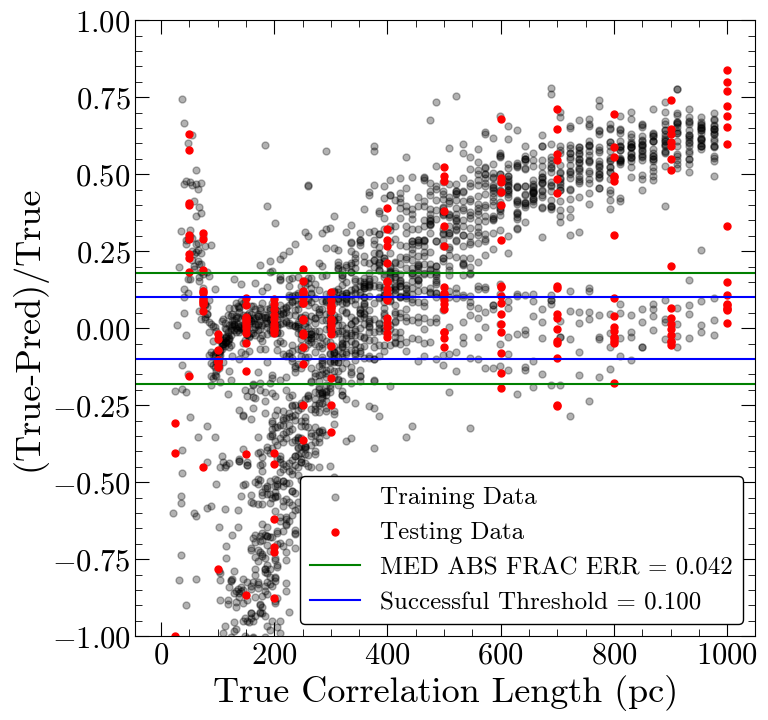

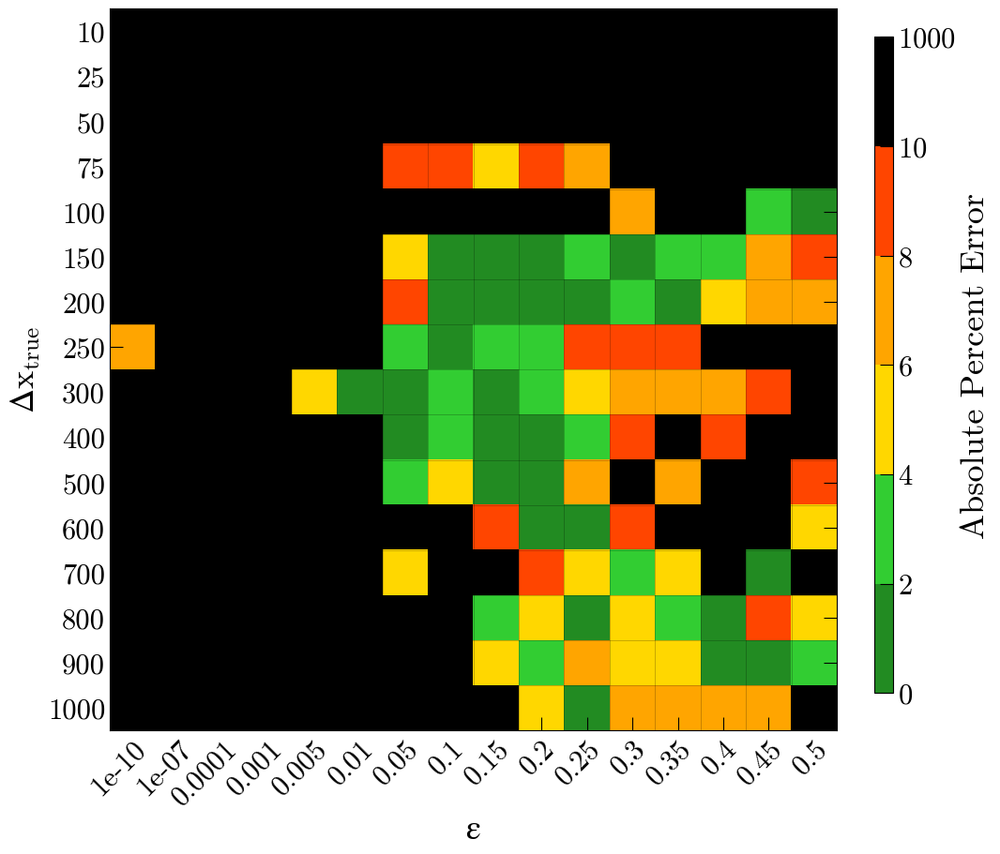

Number of squares with abs percent err>10%,  162


In [36]:
#model with more layers, increase max pooling in first layer
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 2s 10ms/step - loss: 99864.2344
Epoch 2/100
92/92 [==============================] - 1s 10ms/step - loss: 67168.0156
Epoch 3/100
92/92 [==============================] - 1s 9ms/step - loss: 66069.1172
Epoch 4/100
92/92 [==============================] - 1s 9ms/step - loss: 65640.1641
Epoch 5/100
92/92 [==============================] - 1s 7ms/step - loss: 65034.9766
Epoch 6/100
92/92 [==============================] - 1s 8ms/step - loss: 63980.4688
Epoch 7/100
92/92 [==============================] - 1s 9ms/step - loss: 62693.3633
Epoch 8/100
92/92 [==============================] - 1s 9ms/step - loss: 60770.3672
Epoch 9/100
92/92 [==============================] - 1s 7ms/step - loss: 59077.6914
Epoch 10/100
92/92 [==============================] - 1s 8ms/step - loss: 58265.1680
Epoch 11/100
92/92 [==============================] - 1s 8ms/step - loss: 57967.8906
Epoch 12/100
92/92 [==============================] - 1s 8ms/step - loss

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 224.122 pc
MAE: 140.523 pc
BIAS: -14.313 pc
MED FRAC ERR: 0.471 

Training Stats, Successful Fits
Frac Success Fit: 0.207 
RMSE: 21.653 pc
MAE: 10.803 pc
BIAS: 3.465 pc
MED FRAC ERR: 0.043 

Testing Stats
RMSE: 217.962 pc
MAE: 50.498 pc
BIAS: 5.270 pc
MED FRAC ERR: 0.164 

Testing Stats, Successful Fits
Frac Success Fit: 0.406 
RMSE: 25.896 pc
MAE: 9.507 pc
BIAS: 4.261 pc
MED FRAC ERR: 0.036 


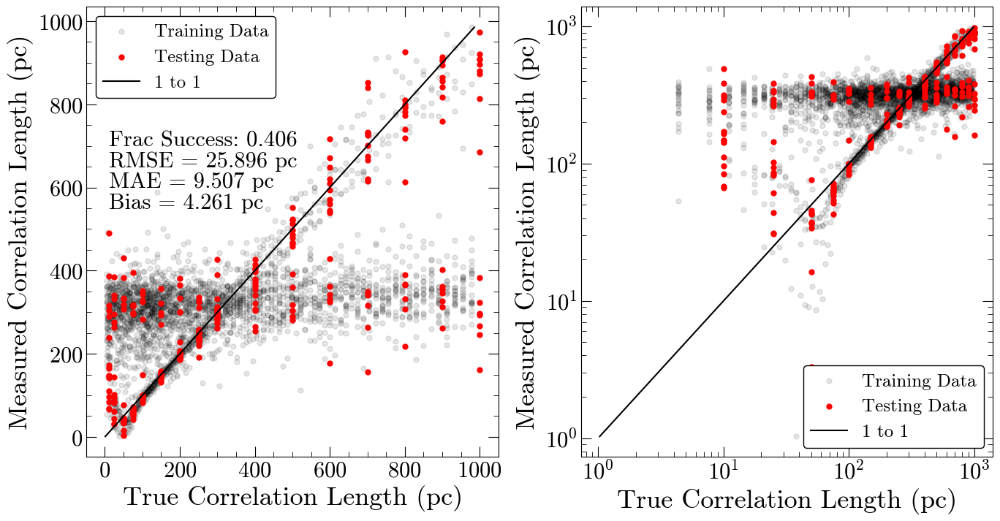

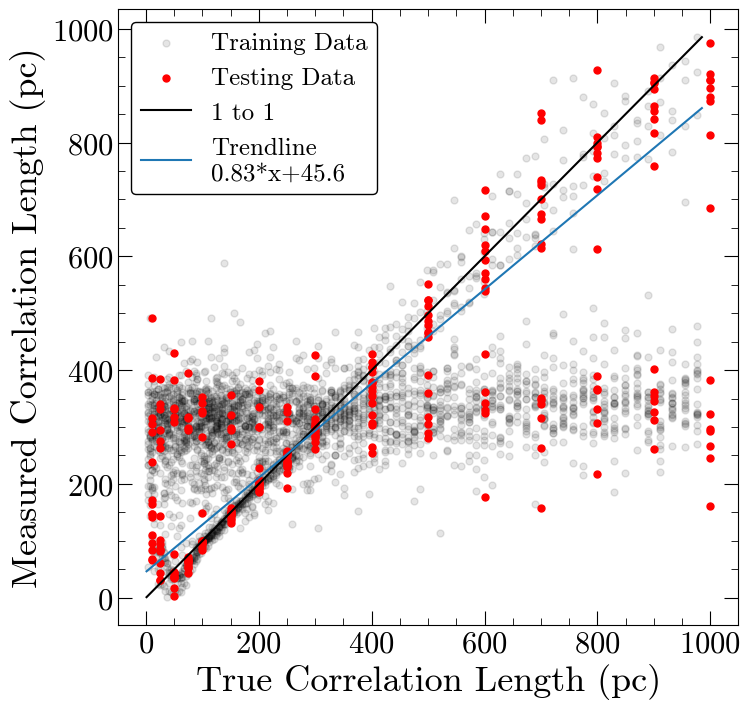

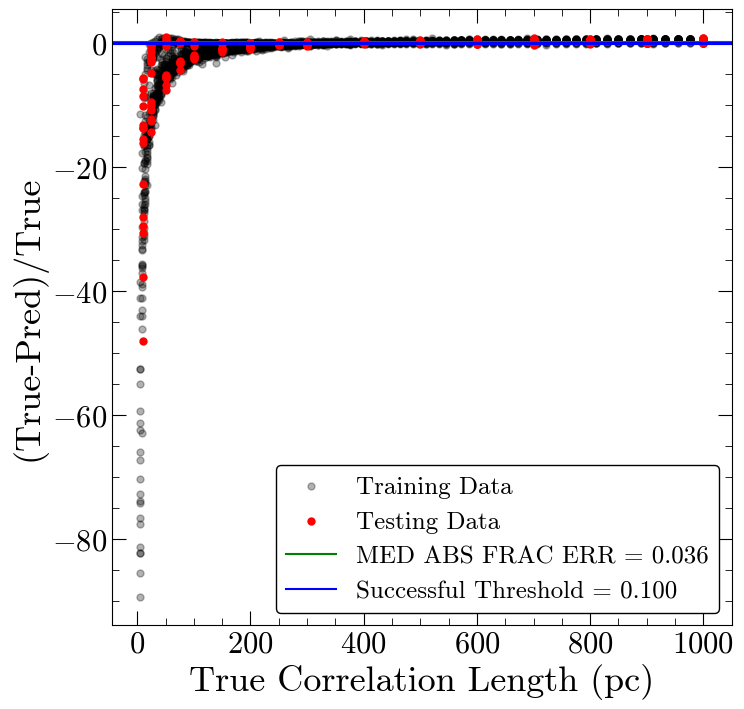

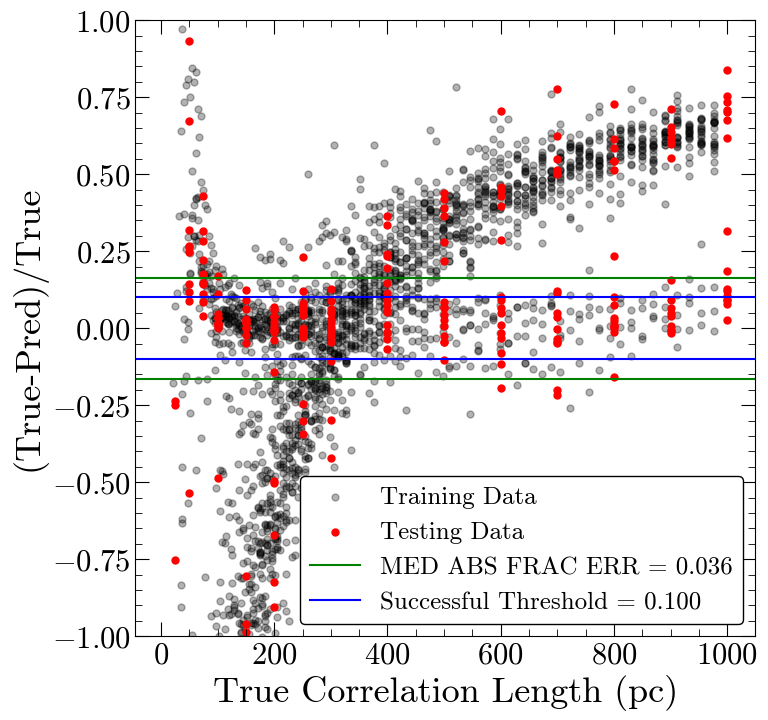

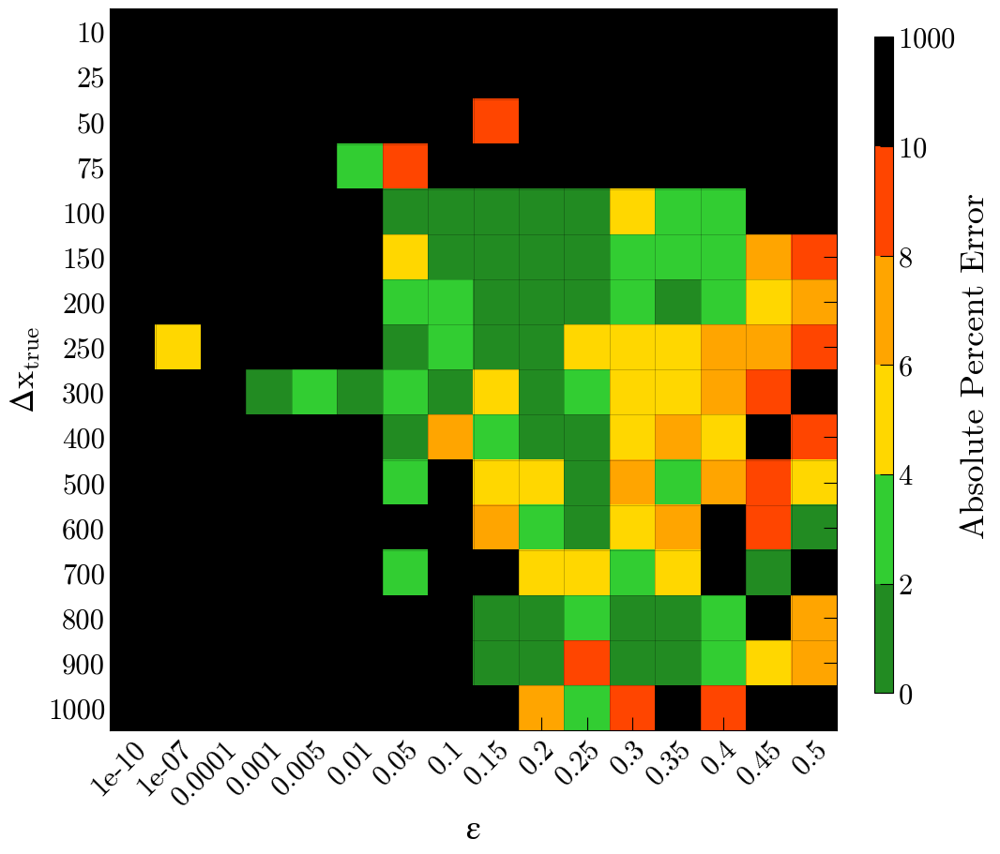

Number of squares with abs percent err>10%,  152


In [37]:
#model with more layers, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 2s 10ms/step - loss: 104186.8750
Epoch 2/200
92/92 [==============================] - 1s 12ms/step - loss: 66283.3359
Epoch 3/200
92/92 [==============================] - 1s 10ms/step - loss: 65814.5547
Epoch 4/200
92/92 [==============================] - 1s 8ms/step - loss: 65652.4062
Epoch 5/200
92/92 [==============================] - 1s 15ms/step - loss: 65806.4297
Epoch 6/200
92/92 [==============================] - 1s 13ms/step - loss: 65397.4336
Epoch 7/200
92/92 [==============================] - 1s 9ms/step - loss: 64909.4492
Epoch 8/200
92/92 [==============================] - 1s 8ms/step - loss: 64348.2383
Epoch 9/200
92/92 [==============================] - 1s 7ms/step - loss: 63431.1602
Epoch 10/200
92/92 [==============================] - 1s 7ms/step - loss: 62309.6680
Epoch 11/200
92/92 [==============================] - 1s 8ms/step - loss: 60915.6133
Epoch 12/200
92/92 [==============================] - 1s 9ms/step - 

92/92 [==============================] - 1s 9ms/step - loss: 34115.7148
Epoch 193/200
92/92 [==============================] - 1s 9ms/step - loss: 33806.5664
Epoch 194/200
92/92 [==============================] - 1s 8ms/step - loss: 34570.8672
Epoch 195/200
92/92 [==============================] - 1s 10ms/step - loss: 33470.3906
Epoch 196/200
92/92 [==============================] - 1s 10ms/step - loss: 33654.2383
Epoch 197/200
92/92 [==============================] - 1s 9ms/step - loss: 33167.9570
Epoch 198/200
92/92 [==============================] - 1s 9ms/step - loss: 34023.5469
Epoch 199/200
92/92 [==============================] - 1s 9ms/step - loss: 35064.8750
Epoch 200/200
92/92 [==============================] - 1s 8ms/step - loss: 33261.1953

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 173.295 pc
MAE: 89.115 pc
BIAS: -8.085 pc
MED FRAC ERR: 0.334 

Training Stats, Successful Fits
Frac Success Fit: 0.224 
RMSE: 24.399 pc
MAE: 12.299 pc
BIAS: 2.312 pc
MED FRAC ERR: 0.048 

Testing Stats
RMSE: 229.756 pc
MAE: 46.891 pc
BIAS: 4.432 pc
MED FRAC ERR: 0.159 

Testing Stats, Successful Fits
Frac Success Fit: 0.398 
RMSE: 24.994 pc
MAE: 9.538 pc
BIAS: 2.095 pc
MED FRAC ERR: 0.041 


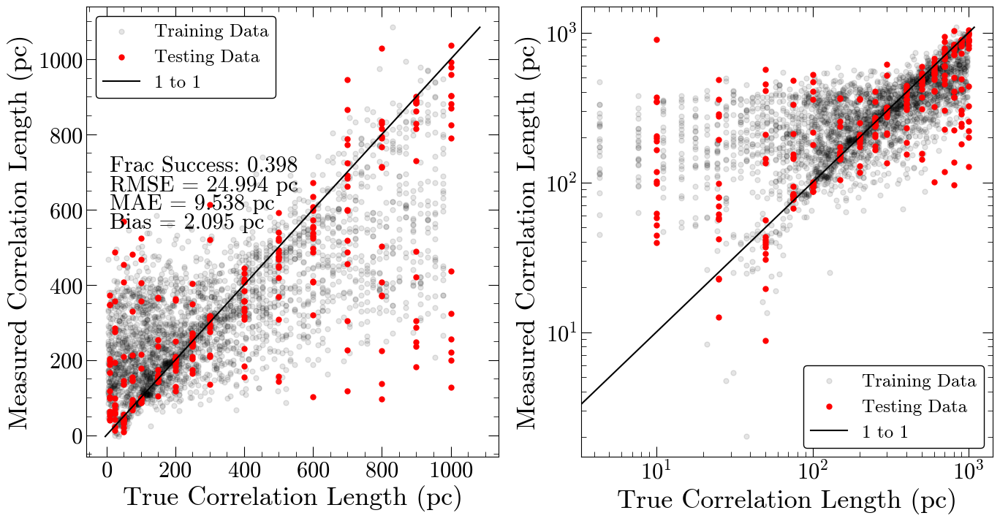

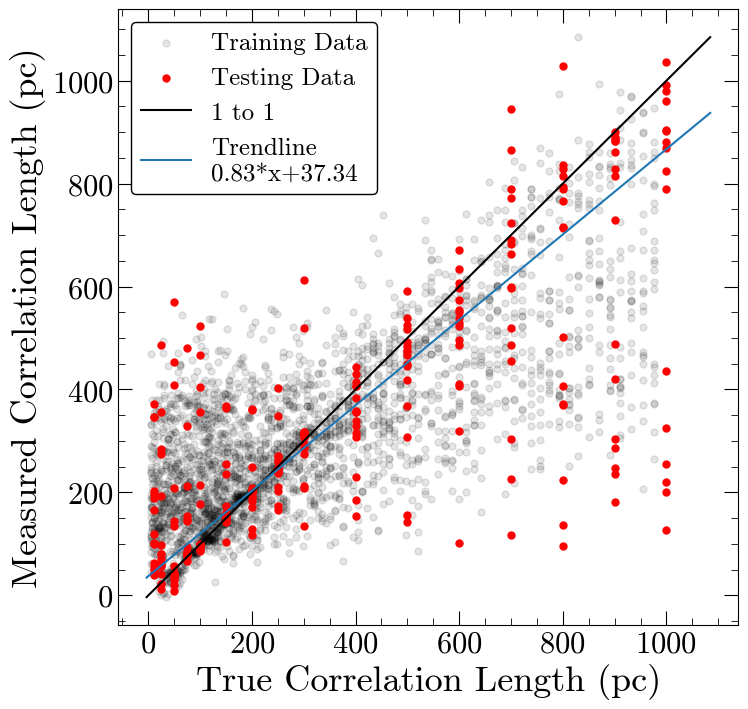

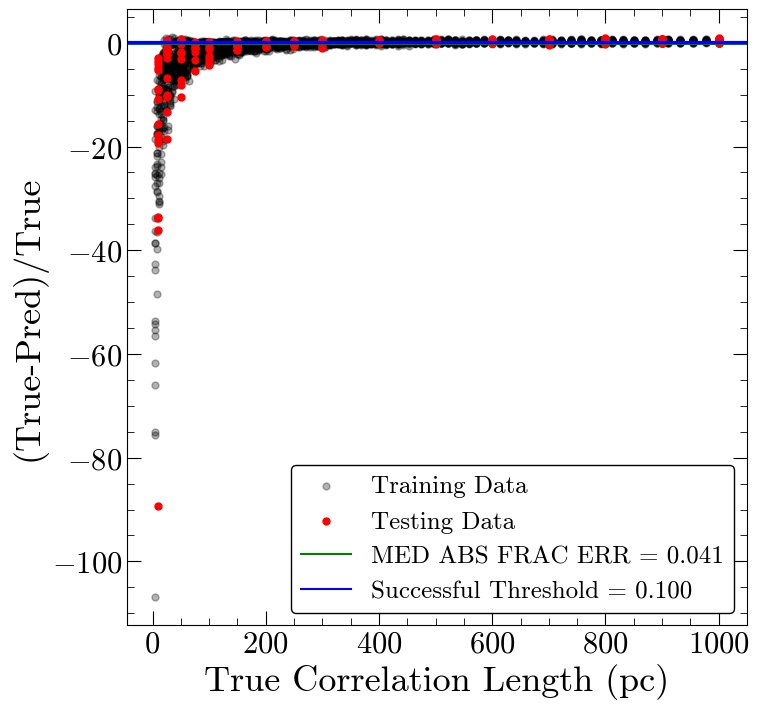

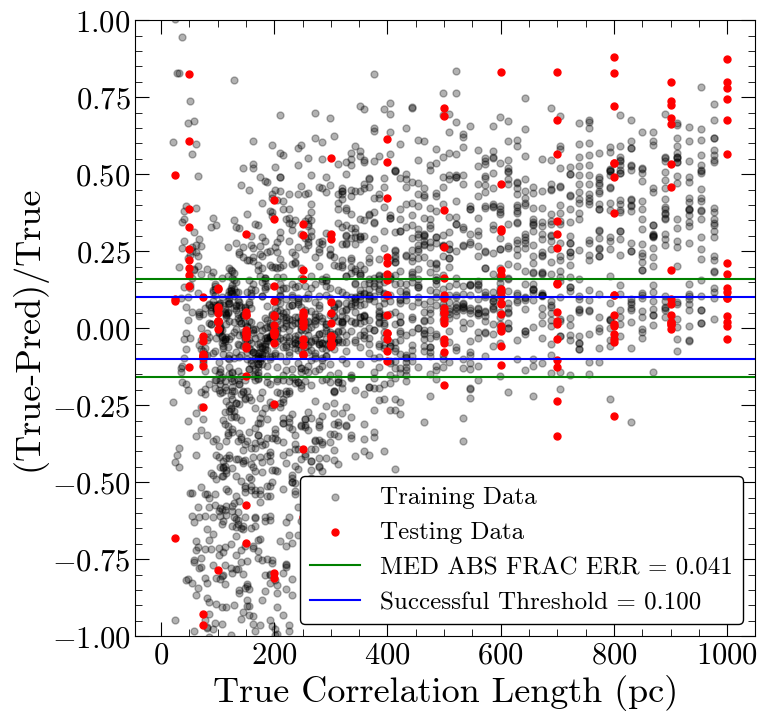

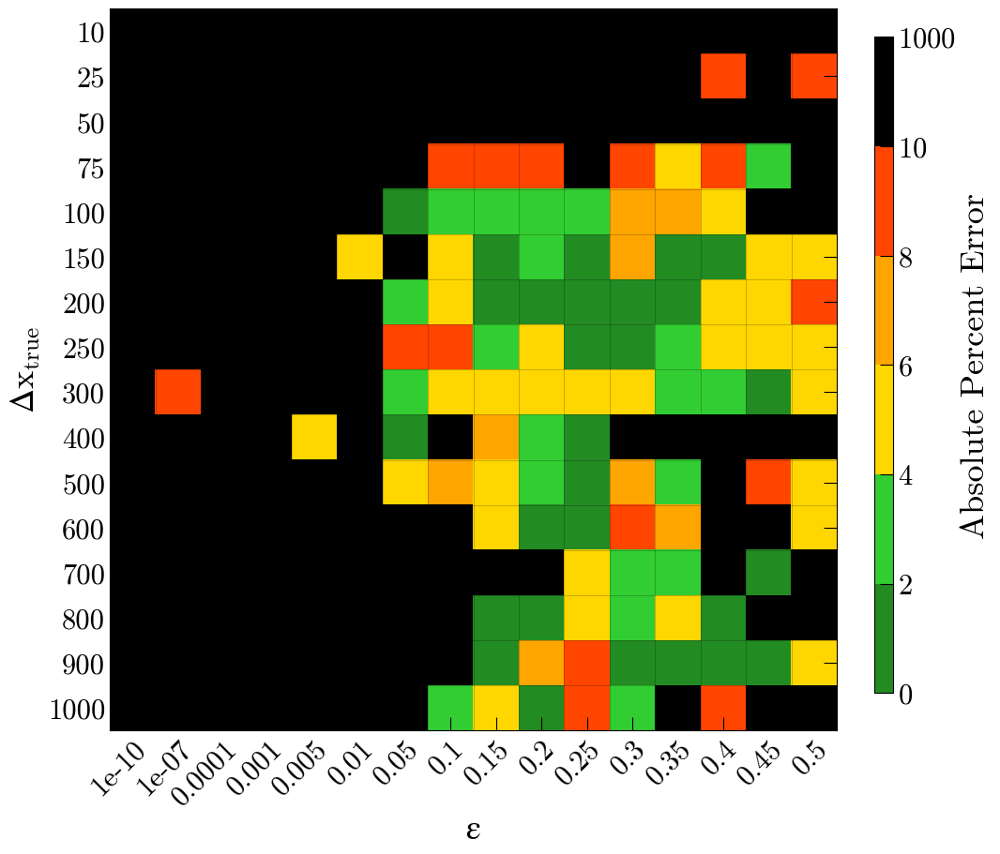

Number of squares with abs percent err>10%,  154


In [38]:
#model with more layers, run for more epochs, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 2s 11ms/step - loss: 96405.2500
Epoch 2/400
92/92 [==============================] - 1s 9ms/step - loss: 67020.1641
Epoch 3/400
92/92 [==============================] - 1s 9ms/step - loss: 66507.4219
Epoch 4/400
92/92 [==============================] - 1s 10ms/step - loss: 65498.5430
Epoch 5/400
92/92 [==============================] - 1s 10ms/step - loss: 64948.1094
Epoch 6/400
92/92 [==============================] - 1s 10ms/step - loss: 64395.8984
Epoch 7/400
92/92 [==============================] - 1s 11ms/step - loss: 63151.8203
Epoch 8/400
92/92 [==============================] - 1s 10ms/step - loss: 62121.8086
Epoch 9/400
92/92 [==============================] - 1s 10ms/step - loss: 61267.4453
Epoch 10/400
92/92 [==============================] - 1s 10ms/step - loss: 59084.2578
Epoch 11/400
92/92 [==============================] - 1s 10ms/step - loss: 58529.9492
Epoch 12/400
92/92 [==============================] - 1s 10ms/ste

92/92 [==============================] - 1s 11ms/step - loss: 33962.1367
Epoch 191/400
92/92 [==============================] - 1s 12ms/step - loss: 33443.5391
Epoch 192/400
92/92 [==============================] - 1s 12ms/step - loss: 32730.7773
Epoch 193/400
92/92 [==============================] - 1s 10ms/step - loss: 32480.5508
Epoch 194/400
92/92 [==============================] - 1s 11ms/step - loss: 31802.3633
Epoch 195/400
92/92 [==============================] - 1s 12ms/step - loss: 31538.1660
Epoch 196/400
92/92 [==============================] - 1s 14ms/step - loss: 31290.9434
Epoch 197/400
92/92 [==============================] - 1s 12ms/step - loss: 31414.4414
Epoch 198/400
92/92 [==============================] - 1s 11ms/step - loss: 30886.4824
Epoch 199/400
92/92 [==============================] - 1s 10ms/step - loss: 30685.1660
Epoch 200/400
92/92 [==============================] - 1s 10ms/step - loss: 30850.6699
Epoch 201/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 11ms/step - loss: 9474.7812
Epoch 379/400
92/92 [==============================] - 1s 11ms/step - loss: 8594.0117
Epoch 380/400
92/92 [==============================] - 1s 10ms/step - loss: 8740.5957
Epoch 381/400
92/92 [==============================] - 1s 10ms/step - loss: 7290.2148
Epoch 382/400
92/92 [==============================] - 1s 10ms/step - loss: 7639.5181
Epoch 383/400
92/92 [==============================] - 1s 10ms/step - loss: 7133.8550
Epoch 384/400
92/92 [==============================] - 1s 11ms/step - loss: 7700.2822
Epoch 385/400
92/92 [==============================] - 1s 10ms/step - loss: 7194.7944
Epoch 386/400
92/92 [==============================] - 1s 11ms/step - loss: 7611.6079
Epoch 387/400
92/92 [==============================] - 1s 11ms/step - loss: 8177.4585
Epoch 388/400
92/92 [==============================] - 1s 10ms/step - loss: 6986.3203
Epoch 389/400
92/92 [==============================] - 1s 10ms/step 

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 101.450 pc
MAE: 48.353 pc
BIAS: -18.326 pc
MED FRAC ERR: 0.180 

Training Stats, Successful Fits
Frac Success Fit: 0.350 
RMSE: 28.768 pc
MAE: 13.108 pc
BIAS: 0.463 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 246.981 pc
MAE: 45.843 pc
BIAS: -2.218 pc
MED FRAC ERR: 0.121 

Testing Stats, Successful Fits
Frac Success Fit: 0.473 
RMSE: 30.747 pc
MAE: 13.668 pc
BIAS: -0.329 pc
MED FRAC ERR: 0.049 


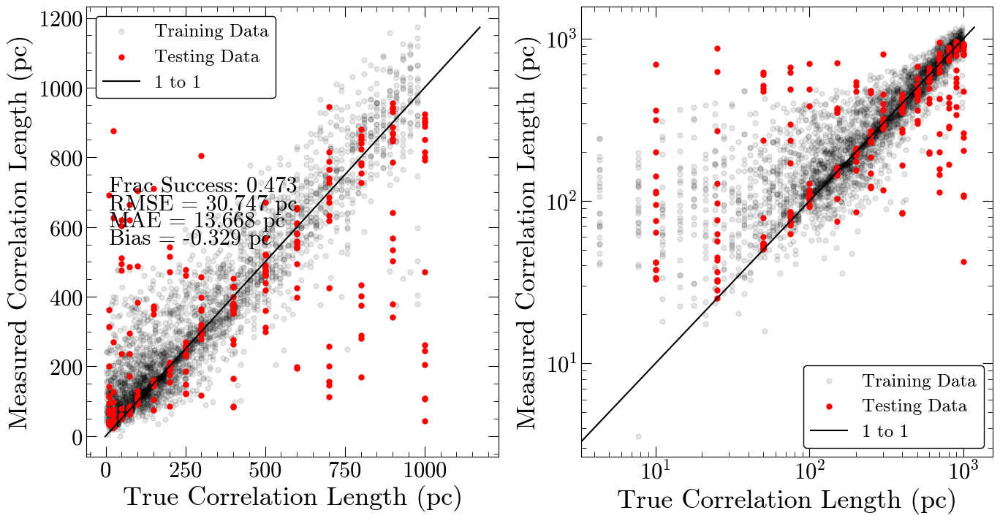

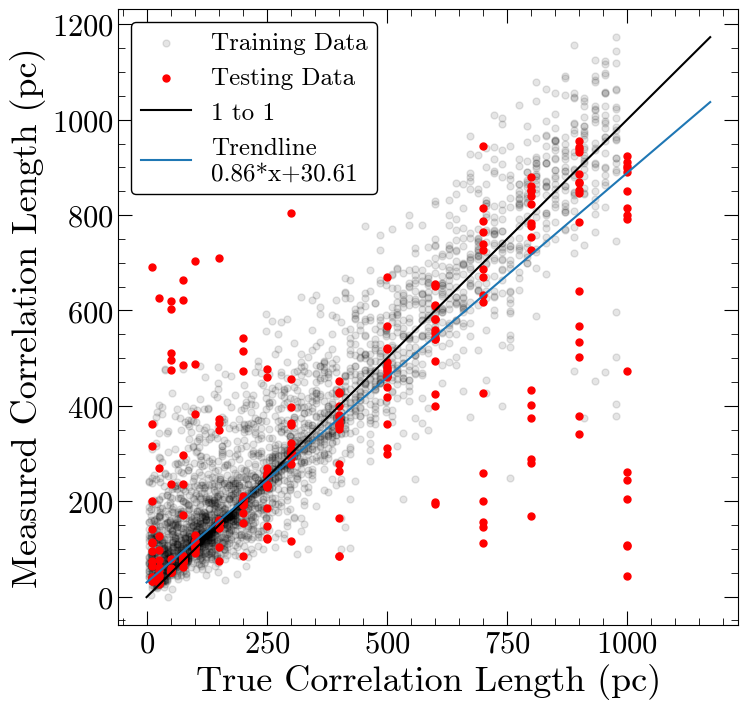

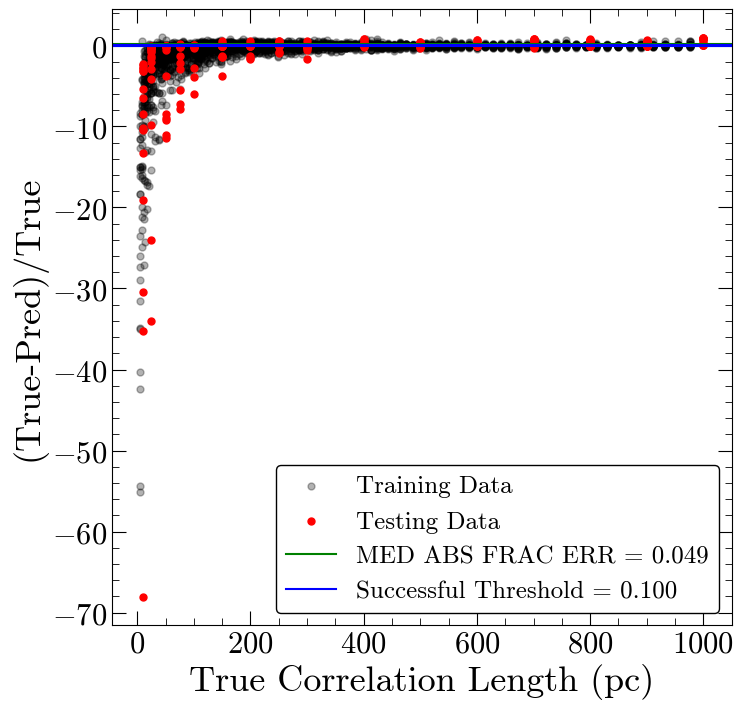

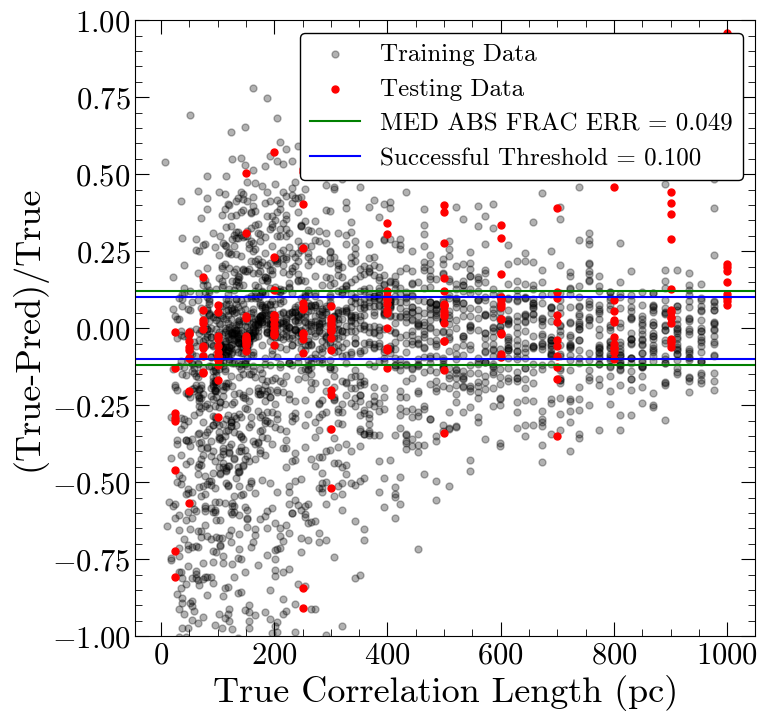

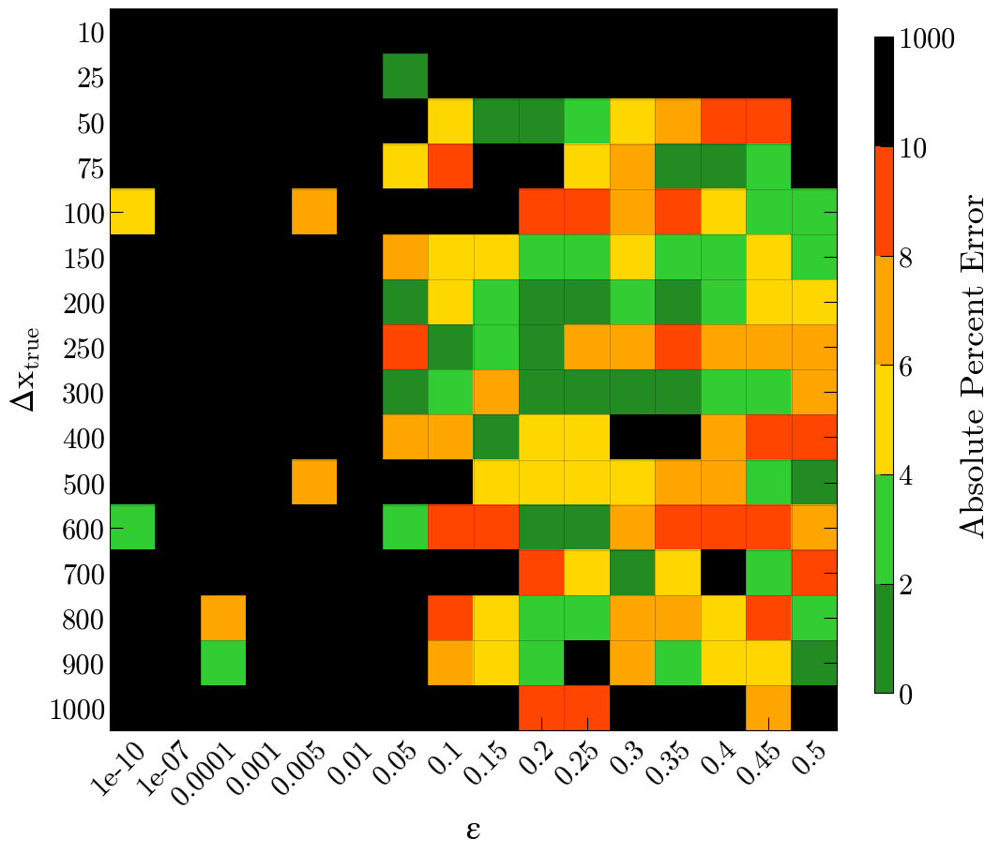

Number of squares with abs percent err>10%,  135


In [39]:
#model with more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 2s 9ms/step - loss: 94476.5625
Epoch 2/400
92/92 [==============================] - 1s 10ms/step - loss: 66496.2656
Epoch 3/400
92/92 [==============================] - 1s 11ms/step - loss: 65555.3984
Epoch 4/400
92/92 [==============================] - 1s 9ms/step - loss: 63919.1680
Epoch 5/400
92/92 [==============================] - 1s 9ms/step - loss: 61235.1016
Epoch 6/400
92/92 [==============================] - 1s 11ms/step - loss: 59477.6094
Epoch 7/400
92/92 [==============================] - 1s 10ms/step - loss: 58105.3164
Epoch 8/400
92/92 [==============================] - 1s 10ms/step - loss: 57943.8984
Epoch 9/400
92/92 [==============================] - 1s 9ms/step - loss: 57572.3594
Epoch 10/400
92/92 [==============================] - 1s 11ms/step - loss: 59247.2812
Epoch 11/400
92/92 [==============================] - 1s 9ms/step - loss: 56718.5742
Epoch 12/400
92/92 [==============================] - 1s 10ms/step -

92/92 [==============================] - 1s 11ms/step - loss: 5607.2300
Epoch 191/400
92/92 [==============================] - 1s 12ms/step - loss: 6403.6187
Epoch 192/400
92/92 [==============================] - 1s 13ms/step - loss: 6686.1768
Epoch 193/400
92/92 [==============================] - 1s 14ms/step - loss: 5757.1816
Epoch 194/400
92/92 [==============================] - 1s 12ms/step - loss: 7248.5840
Epoch 195/400
92/92 [==============================] - 1s 11ms/step - loss: 5815.5420
Epoch 196/400
92/92 [==============================] - 1s 12ms/step - loss: 5184.0098
Epoch 197/400
92/92 [==============================] - 1s 14ms/step - loss: 5210.7310
Epoch 198/400
92/92 [==============================] - 1s 16ms/step - loss: 5774.5054
Epoch 199/400
92/92 [==============================] - 1s 11ms/step - loss: 5791.9390
Epoch 200/400
92/92 [==============================] - 1s 12ms/step - loss: 5187.4175
Epoch 201/400
92/92 [==============================] - 1s 14ms/step 

92/92 [==============================] - 1s 10ms/step - loss: 1939.7599
Epoch 381/400
92/92 [==============================] - 1s 10ms/step - loss: 1978.2072
Epoch 382/400
92/92 [==============================] - 1s 12ms/step - loss: 1802.4924
Epoch 383/400
92/92 [==============================] - 1s 12ms/step - loss: 1964.5013
Epoch 384/400
92/92 [==============================] - 1s 9ms/step - loss: 2389.2251
Epoch 385/400
92/92 [==============================] - 1s 11ms/step - loss: 1833.2834
Epoch 386/400
92/92 [==============================] - 1s 9ms/step - loss: 2002.3022
Epoch 387/400
92/92 [==============================] - 1s 11ms/step - loss: 1930.4935
Epoch 388/400
92/92 [==============================] - 1s 10ms/step - loss: 1890.8146
Epoch 389/400
92/92 [==============================] - 1s 10ms/step - loss: 1543.0522
Epoch 390/400
92/92 [==============================] - 1s 9ms/step - loss: 1859.1743
Epoch 391/400
92/92 [==============================] - 1s 10ms/step - l

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 37.094 pc
MAE: 16.722 pc
BIAS: -7.893 pc
MED FRAC ERR: 0.066 

Training Stats, Successful Fits
Frac Success Fit: 0.624 
RMSE: 20.041 pc
MAE: 10.520 pc
BIAS: -2.338 pc
MED FRAC ERR: 0.034 

Testing Stats
RMSE: 242.020 pc
MAE: 34.439 pc
BIAS: 0.026 pc
MED FRAC ERR: 0.097 

Testing Stats, Successful Fits
Frac Success Fit: 0.508 
RMSE: 25.633 pc
MAE: 8.516 pc
BIAS: 0.977 pc
MED FRAC ERR: 0.034 


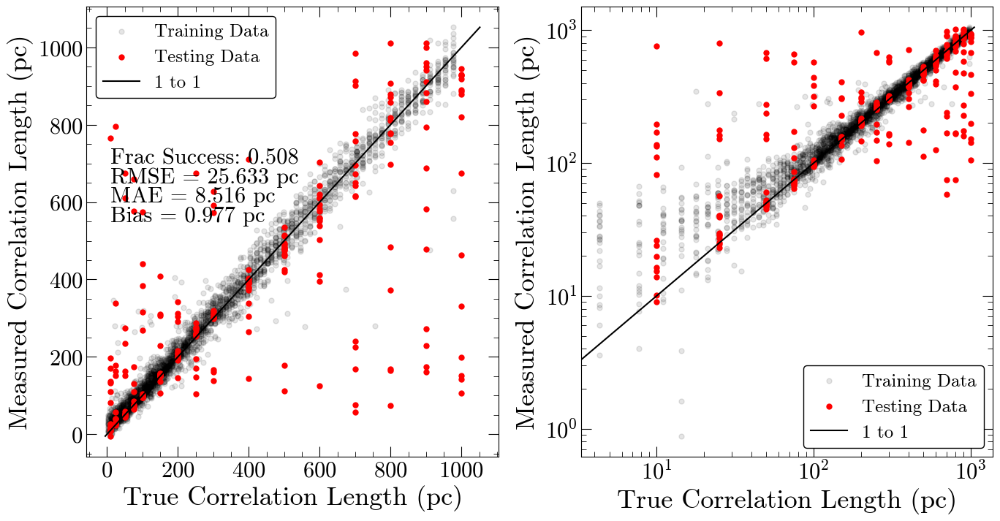

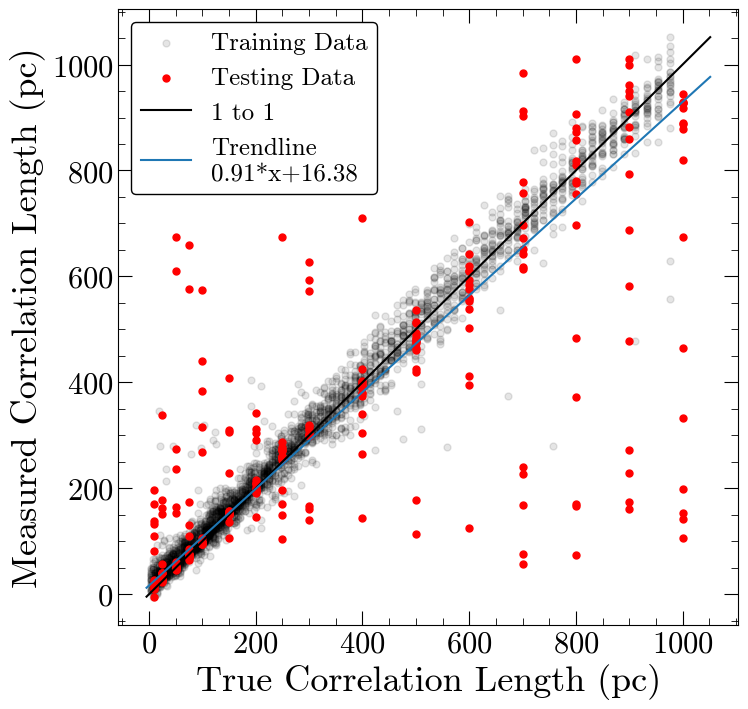

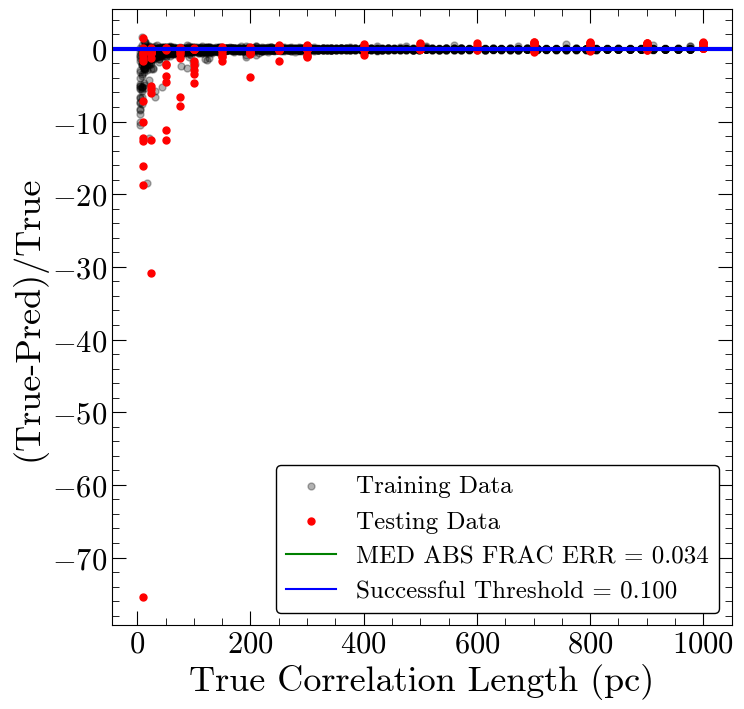

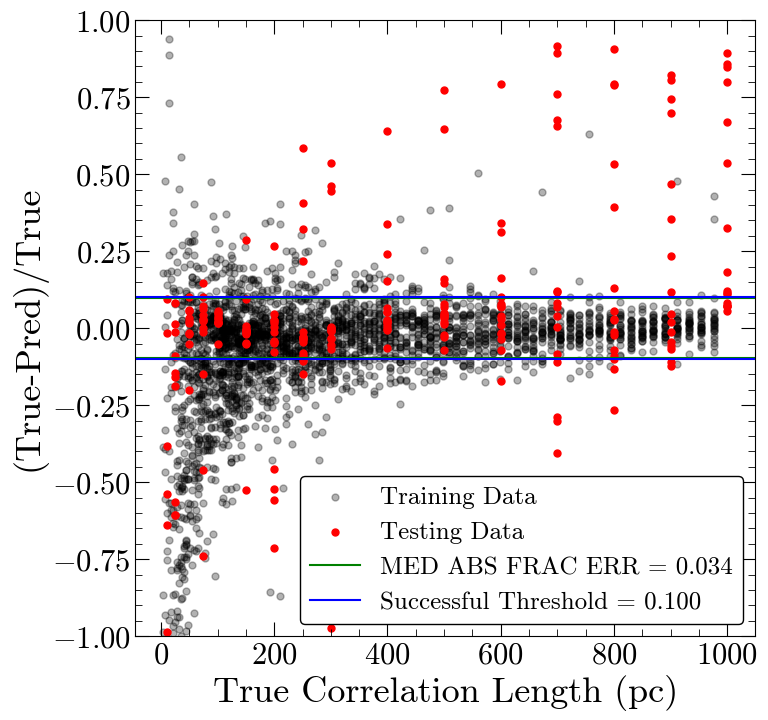

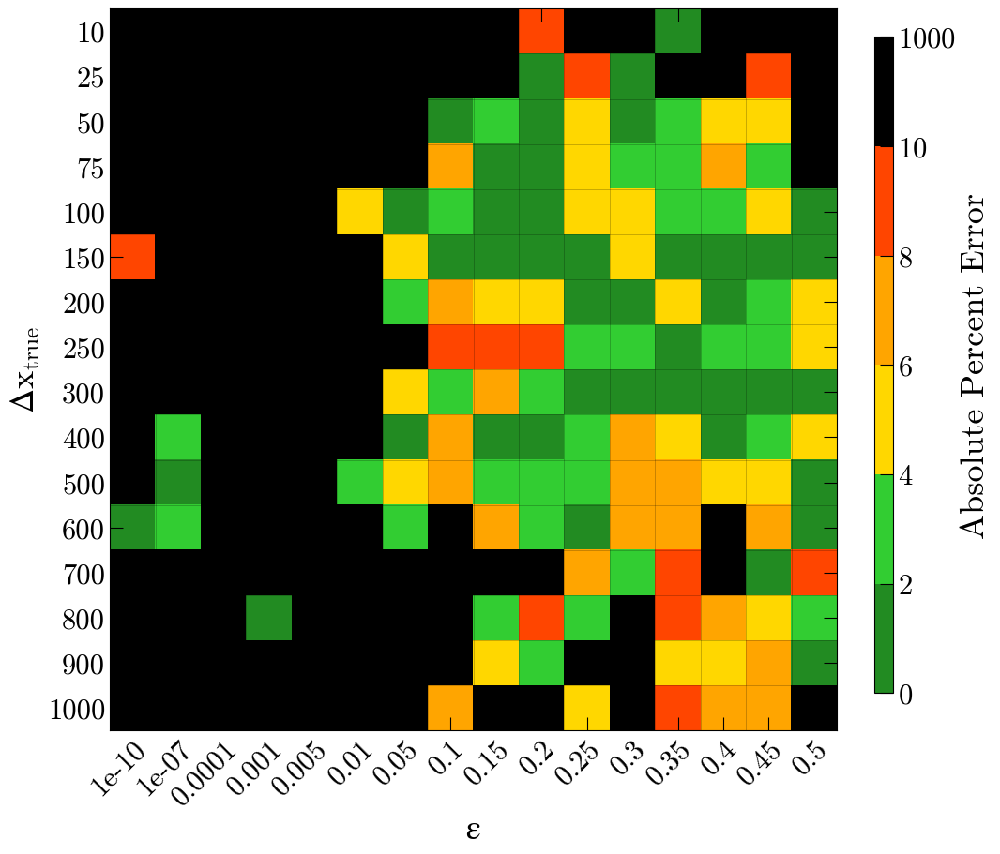

Number of squares with abs percent err>10%,  126


In [40]:
#model with even more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
46/46 [==============================] - 1s 14ms/step - loss: 123066.5312
Epoch 2/400
46/46 [==============================] - 1s 11ms/step - loss: 67689.1328
Epoch 3/400
46/46 [==============================] - 1s 12ms/step - loss: 66784.0469
Epoch 4/400
46/46 [==============================] - 1s 13ms/step - loss: 68033.2031
Epoch 5/400
46/46 [==============================] - 1s 12ms/step - loss: 65923.9219
Epoch 6/400
46/46 [==============================] - 1s 12ms/step - loss: 65183.6484
Epoch 7/400
46/46 [==============================] - 1s 12ms/step - loss: 65070.7070
Epoch 8/400
46/46 [==============================] - 1s 12ms/step - loss: 64196.6406
Epoch 9/400
46/46 [==============================] - 1s 13ms/step - loss: 63654.0625
Epoch 10/400
46/46 [==============================] - 1s 12ms/step - loss: 63330.9727
Epoch 11/400
46/46 [==============================] - 1s 13ms/step - loss: 60290.8906
Epoch 12/400
46/46 [==============================] - 1s 14ms/

46/46 [==============================] - 1s 16ms/step - loss: 24336.2734
Epoch 191/400
46/46 [==============================] - 1s 17ms/step - loss: 26476.5801
Epoch 192/400
46/46 [==============================] - 1s 16ms/step - loss: 25132.4590
Epoch 193/400
46/46 [==============================] - 1s 15ms/step - loss: 24337.6348
Epoch 194/400
46/46 [==============================] - 1s 16ms/step - loss: 23236.6074
Epoch 195/400
46/46 [==============================] - 1s 22ms/step - loss: 24511.2734
Epoch 196/400
46/46 [==============================] - 1s 21ms/step - loss: 23205.0840
Epoch 197/400
46/46 [==============================] - 1s 18ms/step - loss: 22050.5781
Epoch 198/400
46/46 [==============================] - 1s 16ms/step - loss: 27393.8730
Epoch 199/400
46/46 [==============================] - 1s 13ms/step - loss: 23085.6387
Epoch 200/400
46/46 [==============================] - 1s 16ms/step - loss: 22845.3691
Epoch 201/400
46/46 [==============================] - 1s

46/46 [==============================] - 1s 18ms/step - loss: 2903.0432
Epoch 380/400
46/46 [==============================] - 1s 19ms/step - loss: 3193.7275
Epoch 381/400
46/46 [==============================] - 1s 17ms/step - loss: 3363.2891
Epoch 382/400
46/46 [==============================] - 1s 16ms/step - loss: 3928.7104
Epoch 383/400
46/46 [==============================] - 1s 17ms/step - loss: 5237.4082
Epoch 384/400
46/46 [==============================] - 1s 16ms/step - loss: 5667.1372
Epoch 385/400
46/46 [==============================] - 1s 17ms/step - loss: 4696.1504
Epoch 386/400
46/46 [==============================] - 1s 16ms/step - loss: 3545.3438
Epoch 387/400
46/46 [==============================] - 1s 16ms/step - loss: 3060.1318
Epoch 388/400
46/46 [==============================] - 1s 14ms/step - loss: 3866.3259
Epoch 389/400
46/46 [==============================] - 1s 17ms/step - loss: 3348.4927
Epoch 390/400
46/46 [==============================] - 1s 21ms/step 

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 64.645 pc
MAE: 28.533 pc
BIAS: -19.408 pc
MED FRAC ERR: 0.111 

Training Stats, Successful Fits
Frac Success Fit: 0.466 
RMSE: 25.436 pc
MAE: 11.064 pc
BIAS: -4.356 pc
MED FRAC ERR: 0.041 

Testing Stats
RMSE: 246.496 pc
MAE: 39.338 pc
BIAS: -5.079 pc
MED FRAC ERR: 0.120 

Testing Stats, Successful Fits
Frac Success Fit: 0.473 
RMSE: 29.468 pc
MAE: 9.736 pc
BIAS: -3.625 pc
MED FRAC ERR: 0.040 


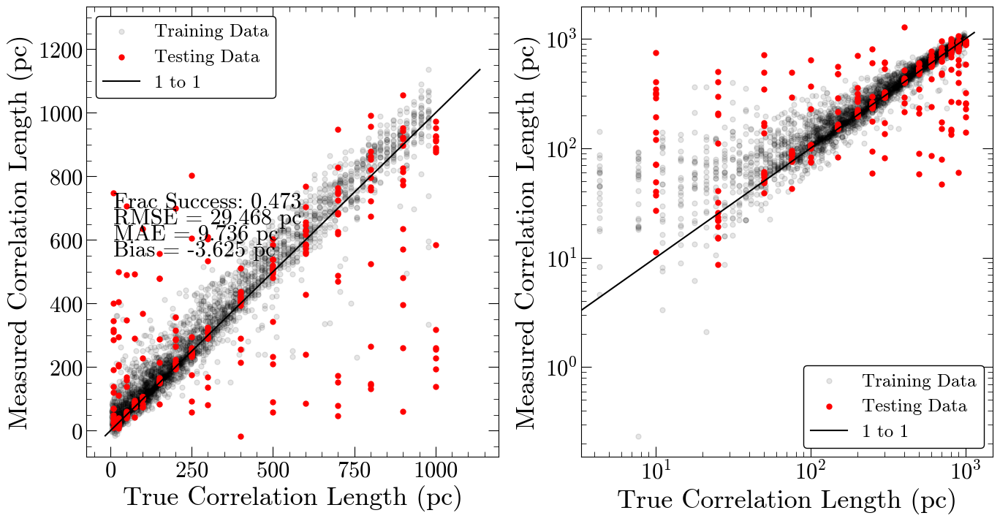

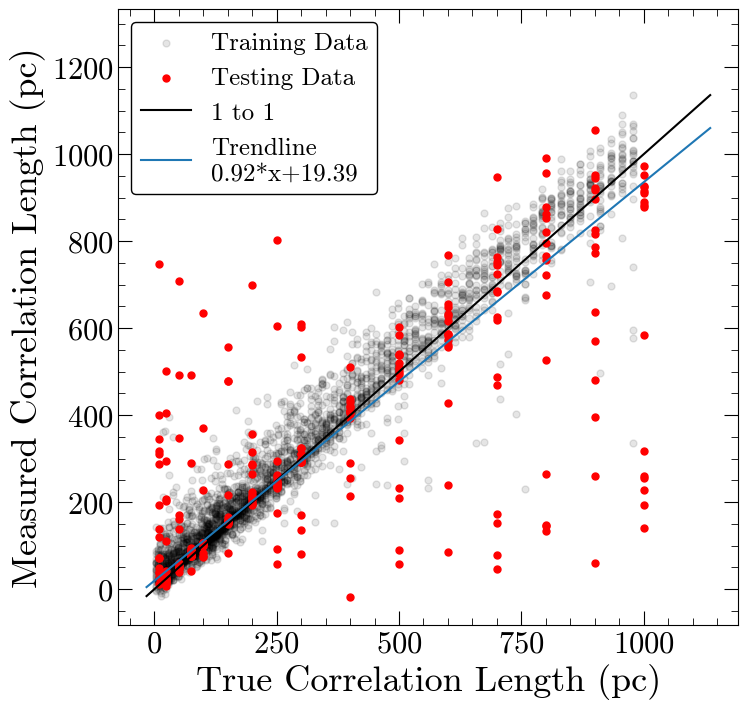

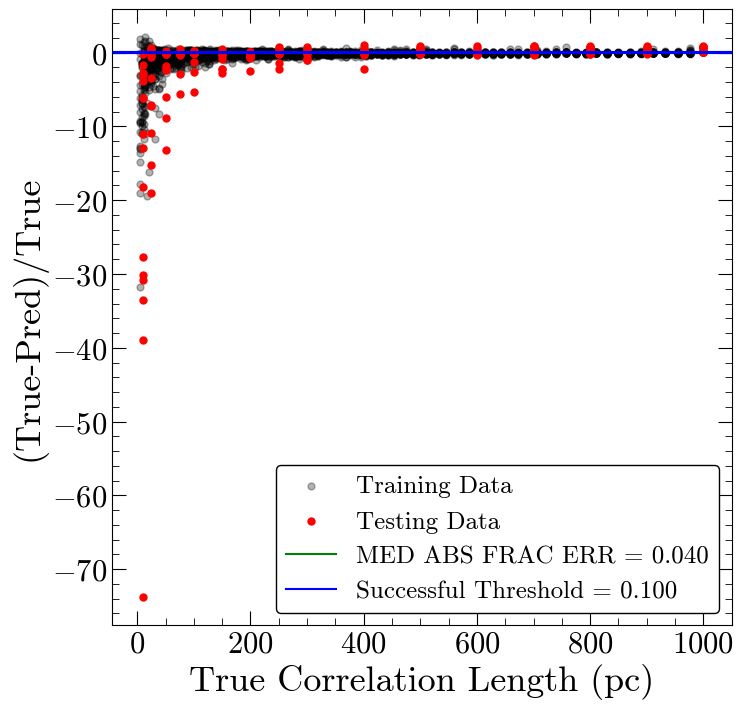

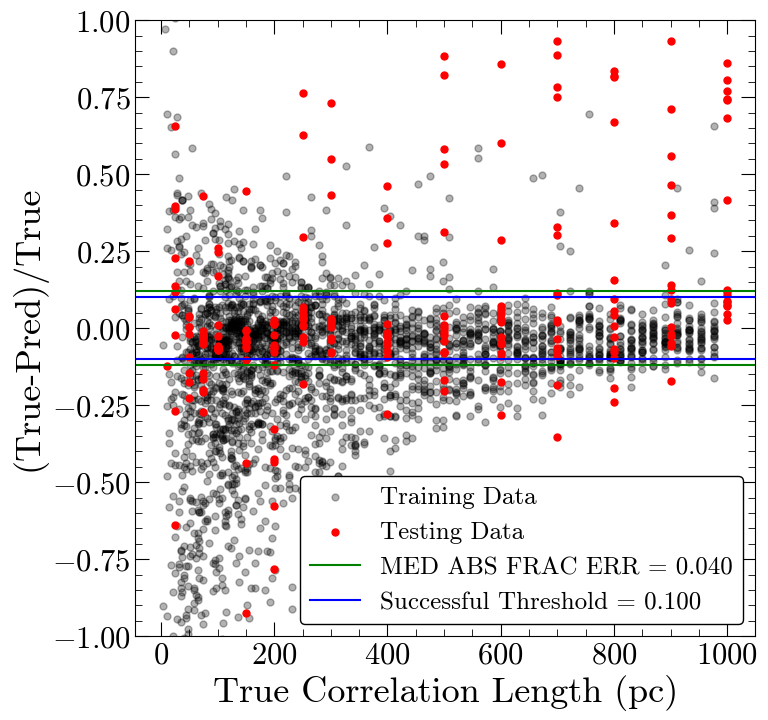

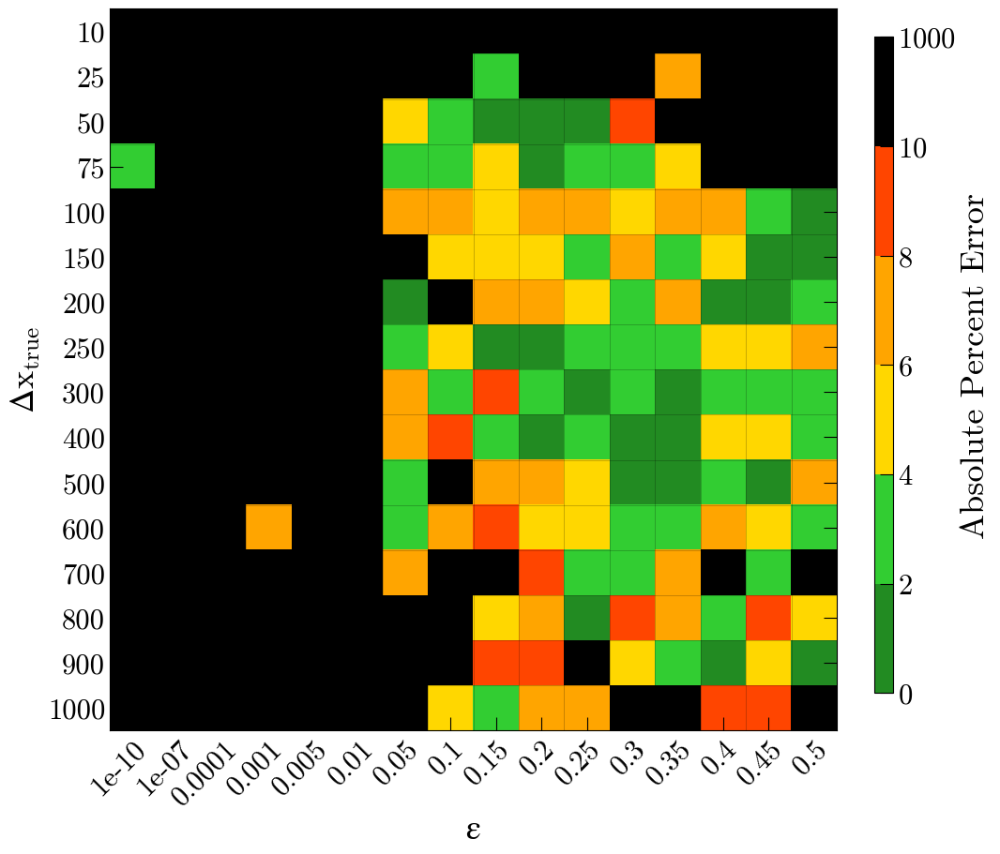

Number of squares with abs percent err>10%,  135


In [41]:
#model with even more layers, run for even more epochs, increase batch size
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=64)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
10/10 [==============================] - 1s 35ms/step - loss: 164067.1250
Epoch 2/400
10/10 [==============================] - 0s 33ms/step - loss: 158918.1250
Epoch 3/400
10/10 [==============================] - 0s 28ms/step - loss: 122123.4141
Epoch 4/400
10/10 [==============================] - 0s 38ms/step - loss: 76696.4219
Epoch 5/400
10/10 [==============================] - 0s 36ms/step - loss: 70831.6953
Epoch 6/400
10/10 [==============================] - 0s 31ms/step - loss: 68574.8516
Epoch 7/400
10/10 [==============================] - 0s 26ms/step - loss: 68029.7422
Epoch 8/400
10/10 [==============================] - 0s 28ms/step - loss: 67335.8203
Epoch 9/400
10/10 [==============================] - 0s 32ms/step - loss: 66768.9531
Epoch 10/400
10/10 [==============================] - 0s 33ms/step - loss: 66404.4219
Epoch 11/400
10/10 [==============================] - 0s 28ms/step - loss: 66293.5938
Epoch 12/400
10/10 [==============================] - 0s 29m

10/10 [==============================] - 0s 35ms/step - loss: 52815.4727
Epoch 191/400
10/10 [==============================] - 0s 33ms/step - loss: 53027.8633
Epoch 192/400
10/10 [==============================] - 0s 33ms/step - loss: 53448.1289
Epoch 193/400
10/10 [==============================] - 0s 32ms/step - loss: 52845.9180
Epoch 194/400
10/10 [==============================] - 0s 27ms/step - loss: 52841.0117
Epoch 195/400
10/10 [==============================] - 0s 35ms/step - loss: 52720.8125
Epoch 196/400
10/10 [==============================] - 0s 49ms/step - loss: 53821.9727
Epoch 197/400
10/10 [==============================] - 0s 38ms/step - loss: 53286.6055
Epoch 198/400
10/10 [==============================] - 0s 43ms/step - loss: 52948.4492
Epoch 199/400
10/10 [==============================] - 0s 36ms/step - loss: 52988.0195
Epoch 200/400
10/10 [==============================] - 0s 32ms/step - loss: 52719.5781
Epoch 201/400
10/10 [==============================] - 0s

10/10 [==============================] - 0s 24ms/step - loss: 39089.2656
Epoch 379/400
10/10 [==============================] - 0s 27ms/step - loss: 37158.3164
Epoch 380/400
10/10 [==============================] - 0s 26ms/step - loss: 36733.5625
Epoch 381/400
10/10 [==============================] - 0s 28ms/step - loss: 36903.9219
Epoch 382/400
10/10 [==============================] - 0s 24ms/step - loss: 36603.6797
Epoch 383/400
10/10 [==============================] - 0s 28ms/step - loss: 36808.9531
Epoch 384/400
10/10 [==============================] - 0s 27ms/step - loss: 36080.8242
Epoch 385/400
10/10 [==============================] - 0s 24ms/step - loss: 36817.1328
Epoch 386/400
10/10 [==============================] - 0s 27ms/step - loss: 35886.7188
Epoch 387/400
10/10 [==============================] - 0s 26ms/step - loss: 36603.3984
Epoch 388/400
10/10 [==============================] - 0s 21ms/step - loss: 37778.8711
Epoch 389/400
10/10 [==============================] - 0s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 190.891 pc
MAE: 96.376 pc
BIAS: 5.296 pc
MED FRAC ERR: 0.366 

Training Stats, Successful Fits
Frac Success Fit: 0.187 
RMSE: 20.054 pc
MAE: 9.011 pc
BIAS: 3.654 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 230.688 pc
MAE: 68.119 pc
BIAS: 18.181 pc
MED FRAC ERR: 0.174 

Testing Stats, Successful Fits
Frac Success Fit: 0.344 
RMSE: 31.208 pc
MAE: 11.511 pc
BIAS: 8.988 pc
MED FRAC ERR: 0.049 


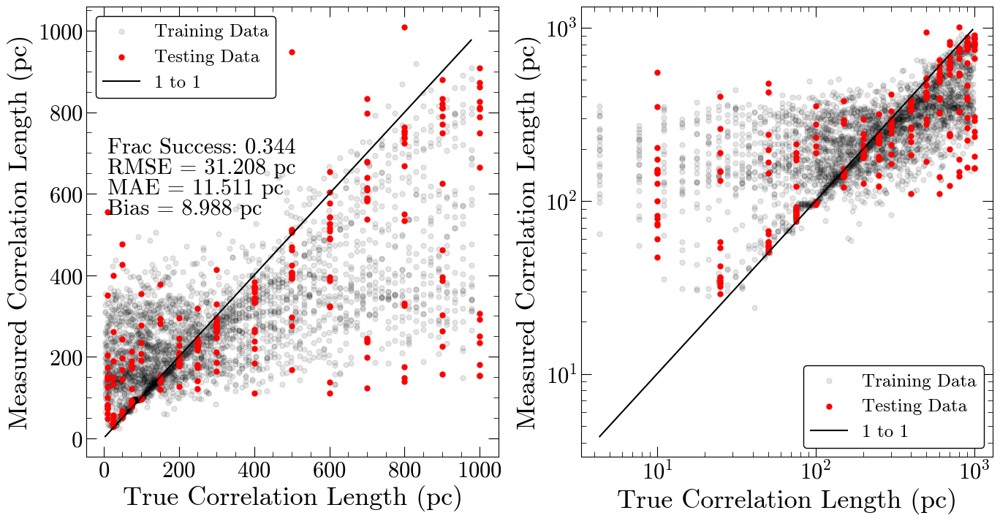

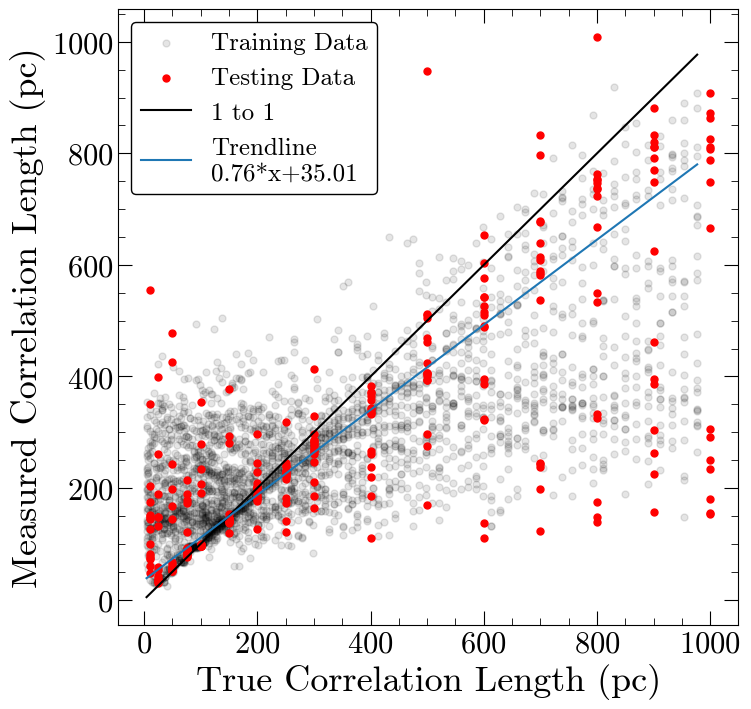

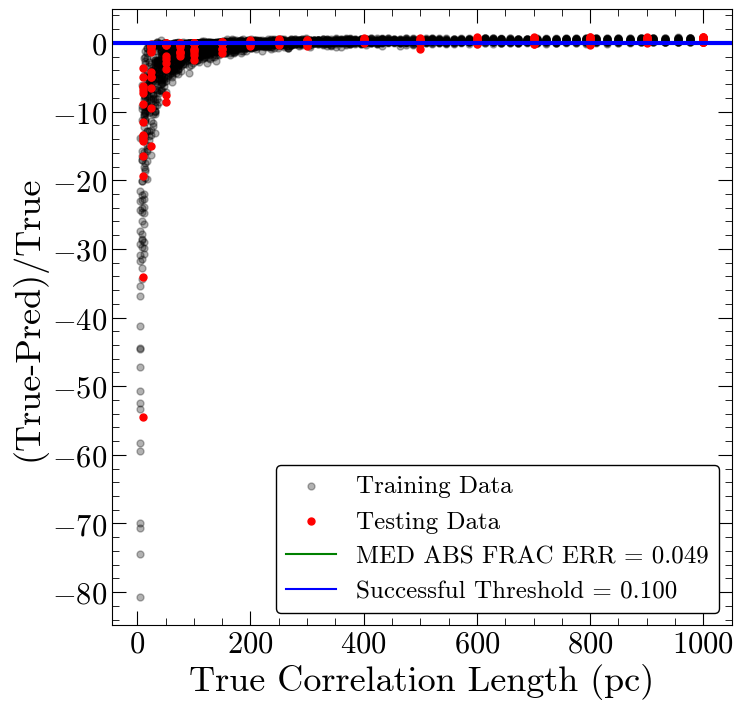

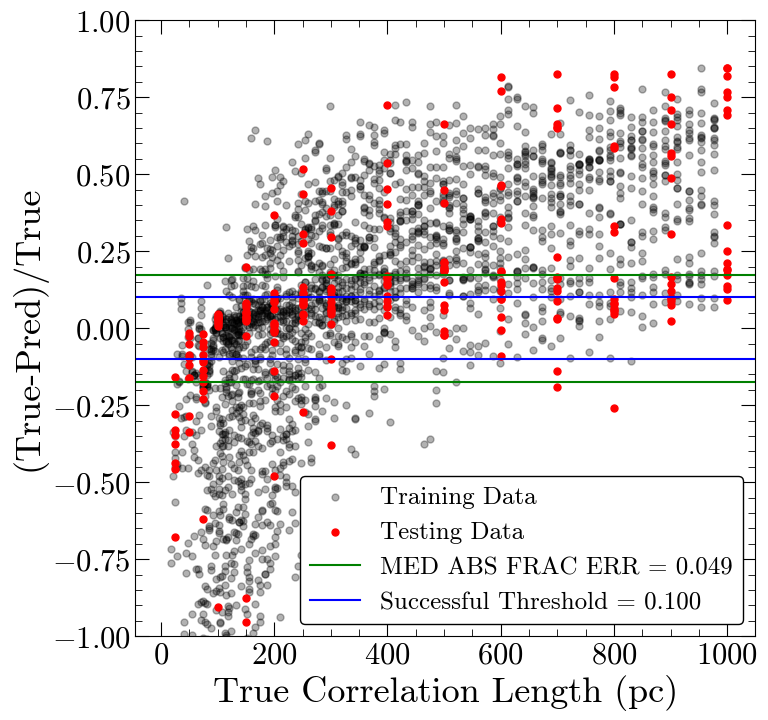

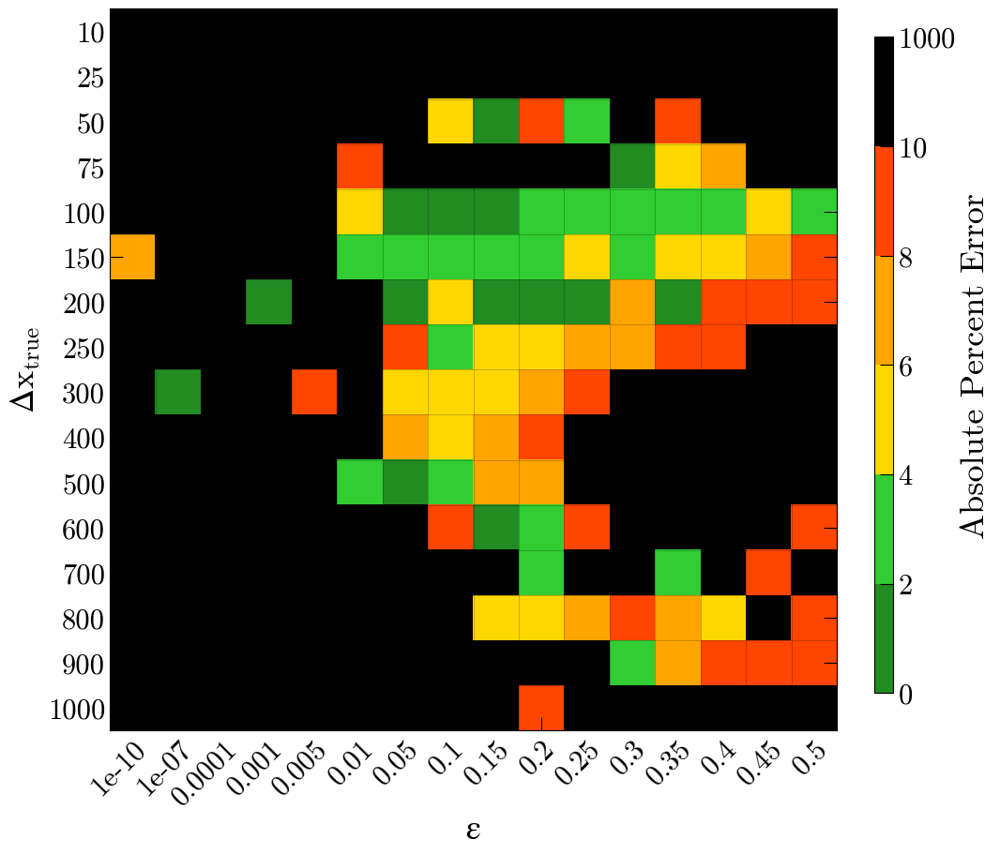

Number of squares with abs percent err>10%,  168


In [42]:
#model with even more layers, run for even more epochs, increase batch size even more
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=300)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

# Save best model

In [43]:
#reset the indices
indices=np.arange(0,len(all_model_stats))
all_model_stats.set_index(indices,inplace=True)
#round all values
all_model_stats=all_model_stats.round(2)

print('Min MAE Training')
print(all_model_stats['mae_training'].idxmin(),', min val=',min(all_model_stats['mae_training']))
print('')

print('Max Frac Success Training')
print(all_model_stats['frac_success_training'].idxmax(),', max val=',max(all_model_stats['frac_success_training']))
print('')

print('Min MAE Testing')
print(all_model_stats['mae_testing'].idxmin(),', min val=',min(all_model_stats['mae_testing']))
print('')

print('Max Frac Success Testing')
print(all_model_stats['frac_success_testing'].idxmax(),', max val=',max(all_model_stats['frac_success_testing']))
print('')

display(all_model_stats)

#best model option is 8


Min MAE Training
8 , min val= 16.72

Max Frac Success Training
8 , max val= 0.62

Min MAE Testing
8 , min val= 34.44

Max Frac Success Testing
8 , max val= 0.51



,mae_training,frac_success_training,mae_testing,frac_success_testing
0,158.69,0.15,74.64,0.30
1,139.42,0.19,50.45,0.39
2,143.11,0.19,55.94,0.40
3,110.47,0.20,37.45,0.38
4,143.90,0.19,55.67,0.37
5,140.52,0.21,50.50,0.41
6,89.12,0.22,46.89,0.40
7,48.35,0.35,45.84,0.47
8,16.72,0.62,34.44,0.51
9,28.53,0.47,39.34,0.47


In [45]:
#choose model 8 which is the best option across all runs

failed_fit_region_count=500

while failed_fit_region_count>126:
    #model with even more layers, run for even more epochs
    final_model = Sequential([
        Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
        MaxPooling1D(2), 
        Conv1D(64, 3, activation='relu'),
        MaxPooling1D(2), 
        Conv1D(128, 3, activation='relu'), 
        MaxPooling1D(2), 
        Flatten(), 
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1) 
    ])

    final_model.compile(optimizer='adam', loss='mse')

    final_model.fit(x_train, y_train, epochs=400, batch_size=32)

    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(final_model,stats=False,plot=False)
    
    print('')
    print(failed_fit_region_count)
    print('')

Epoch 1/400
92/92 [==============================] - 1s 5ms/step - loss: 99359.5391
Epoch 2/400
92/92 [==============================] - 0s 5ms/step - loss: 67472.7969
Epoch 3/400
92/92 [==============================] - 1s 6ms/step - loss: 65701.9062
Epoch 4/400
92/92 [==============================] - 1s 8ms/step - loss: 65380.8438
Epoch 5/400
92/92 [==============================] - 1s 7ms/step - loss: 64943.6367
Epoch 6/400
92/92 [==============================] - 1s 6ms/step - loss: 63164.2930
Epoch 7/400
92/92 [==============================] - 1s 9ms/step - loss: 61757.1992
Epoch 8/400
92/92 [==============================] - 1s 10ms/step - loss: 60266.1719
Epoch 9/400
92/92 [==============================] - 1s 10ms/step - loss: 58799.7969
Epoch 10/400
92/92 [==============================] - 1s 7ms/step - loss: 58397.8789
Epoch 11/400
92/92 [==============================] - 1s 7ms/step - loss: 58507.0469
Epoch 12/400
92/92 [==============================] - 1s 7ms/step - loss

92/92 [==============================] - 1s 14ms/step - loss: 16252.1748
Epoch 192/400
92/92 [==============================] - 1s 16ms/step - loss: 17596.7402
Epoch 193/400
92/92 [==============================] - 1s 15ms/step - loss: 17833.8672
Epoch 194/400
92/92 [==============================] - 1s 15ms/step - loss: 17213.7715
Epoch 195/400
92/92 [==============================] - 1s 13ms/step - loss: 15412.5381
Epoch 196/400
92/92 [==============================] - 1s 14ms/step - loss: 14601.6240
Epoch 197/400
92/92 [==============================] - 1s 13ms/step - loss: 14559.0879
Epoch 198/400
92/92 [==============================] - 1s 14ms/step - loss: 14906.5811
Epoch 199/400
92/92 [==============================] - 1s 15ms/step - loss: 15702.8154
Epoch 200/400
92/92 [==============================] - 1s 14ms/step - loss: 14558.0596
Epoch 201/400
92/92 [==============================] - 1s 13ms/step - loss: 14693.1162
Epoch 202/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 15ms/step - loss: 5102.5991
Epoch 287/400
92/92 [==============================] - 2s 17ms/step - loss: 4775.6685
Epoch 288/400
92/92 [==============================] - 1s 15ms/step - loss: 4418.7051
Epoch 289/400
92/92 [==============================] - 1s 15ms/step - loss: 4090.4414
Epoch 290/400
92/92 [==============================] - 1s 15ms/step - loss: 4346.2847
Epoch 291/400
92/92 [==============================] - 1s 16ms/step - loss: 4291.5698
Epoch 292/400
92/92 [==============================] - 1s 15ms/step - loss: 5301.6514
Epoch 293/400
92/92 [==============================] - 1s 16ms/step - loss: 5092.9194
Epoch 294/400
92/92 [==============================] - 1s 16ms/step - loss: 5591.3716
Epoch 295/400
92/92 [==============================] - 2s 16ms/step - loss: 6045.7339
Epoch 296/400
92/92 [==============================] - 1s 15ms/step - loss: 5598.9858
Epoch 297/400
92/92 [==============================] - 1s 15ms/step 

92/92 [==============================] - 1s 13ms/step - loss: 50980.6016
Epoch 77/400
92/92 [==============================] - 1s 13ms/step - loss: 51309.5352
Epoch 78/400
92/92 [==============================] - 1s 15ms/step - loss: 51119.3438
Epoch 79/400
92/92 [==============================] - 1s 14ms/step - loss: 52002.4609
Epoch 80/400
92/92 [==============================] - 1s 12ms/step - loss: 51133.8359
Epoch 81/400
92/92 [==============================] - 2s 17ms/step - loss: 50513.2148
Epoch 82/400
92/92 [==============================] - 2s 17ms/step - loss: 50202.6094
Epoch 83/400
92/92 [==============================] - 1s 14ms/step - loss: 50374.3828
Epoch 84/400
92/92 [==============================] - 1s 12ms/step - loss: 49630.8047
Epoch 85/400
92/92 [==============================] - 1s 12ms/step - loss: 49700.7500
Epoch 86/400
92/92 [==============================] - 1s 14ms/step - loss: 48963.2422
Epoch 87/400
92/92 [==============================] - 1s 13ms/step 

92/92 [==============================] - 1s 13ms/step - loss: 4209.2944
Epoch 266/400
92/92 [==============================] - 1s 12ms/step - loss: 4388.2070
Epoch 267/400
92/92 [==============================] - 1s 11ms/step - loss: 4467.8545
Epoch 268/400
92/92 [==============================] - 1s 12ms/step - loss: 4032.6287
Epoch 269/400
92/92 [==============================] - 1s 10ms/step - loss: 3855.1206
Epoch 270/400
92/92 [==============================] - 1s 10ms/step - loss: 3994.6257
Epoch 271/400
92/92 [==============================] - 1s 10ms/step - loss: 4777.7422
Epoch 272/400
92/92 [==============================] - 1s 10ms/step - loss: 4938.8369
Epoch 273/400
92/92 [==============================] - 1s 12ms/step - loss: 4795.7603
Epoch 274/400
92/92 [==============================] - 1s 11ms/step - loss: 4535.0854
Epoch 275/400
92/92 [==============================] - 1s 9ms/step - loss: 3809.5398
Epoch 276/400
92/92 [==============================] - 1s 10ms/step -

92/92 [==============================] - 1s 7ms/step - loss: 2656.3364
Epoch 362/400
92/92 [==============================] - 1s 7ms/step - loss: 2600.1155
Epoch 363/400
92/92 [==============================] - 1s 7ms/step - loss: 2870.0630
Epoch 364/400
92/92 [==============================] - 1s 8ms/step - loss: 3410.2563
Epoch 365/400
92/92 [==============================] - 1s 8ms/step - loss: 4463.9980
Epoch 366/400
92/92 [==============================] - 1s 7ms/step - loss: 3494.5598
Epoch 367/400
92/92 [==============================] - 1s 8ms/step - loss: 3299.4995
Epoch 368/400
92/92 [==============================] - 1s 7ms/step - loss: 4186.2720
Epoch 369/400
92/92 [==============================] - 1s 8ms/step - loss: 3646.7019
Epoch 370/400
92/92 [==============================] - 1s 9ms/step - loss: 2664.7522
Epoch 371/400
92/92 [==============================] - 1s 7ms/step - loss: 2290.9473
Epoch 372/400
92/92 [==============================] - 1s 7ms/step - loss: 2019

92/92 [==============================] - 1s 8ms/step - loss: 32476.0098
Epoch 153/400
92/92 [==============================] - 1s 7ms/step - loss: 31118.1426
Epoch 154/400
92/92 [==============================] - 1s 6ms/step - loss: 30953.7891
Epoch 155/400
92/92 [==============================] - 1s 6ms/step - loss: 30380.6836
Epoch 156/400
92/92 [==============================] - 1s 6ms/step - loss: 28945.2598
Epoch 157/400
92/92 [==============================] - 1s 6ms/step - loss: 30002.9258
Epoch 158/400
92/92 [==============================] - 1s 6ms/step - loss: 30108.8125
Epoch 159/400
92/92 [==============================] - 1s 6ms/step - loss: 29735.9316
Epoch 160/400
92/92 [==============================] - 1s 6ms/step - loss: 27520.1680
Epoch 161/400
92/92 [==============================] - 1s 6ms/step - loss: 26843.2461
Epoch 162/400
92/92 [==============================] - 1s 11ms/step - loss: 26464.5645
Epoch 163/400
92/92 [==============================] - 1s 9ms/step 

92/92 [==============================] - 1s 6ms/step - loss: 3892.0339
Epoch 344/400
92/92 [==============================] - 1s 6ms/step - loss: 4686.2769
Epoch 345/400
92/92 [==============================] - 1s 6ms/step - loss: 3946.7908
Epoch 346/400
92/92 [==============================] - 0s 5ms/step - loss: 3094.3335
Epoch 347/400
92/92 [==============================] - 1s 5ms/step - loss: 2931.3262
Epoch 348/400
92/92 [==============================] - 0s 5ms/step - loss: 2941.2539
Epoch 349/400
92/92 [==============================] - 1s 6ms/step - loss: 3914.5105
Epoch 350/400
92/92 [==============================] - 1s 6ms/step - loss: 3608.7820
Epoch 351/400
92/92 [==============================] - 1s 5ms/step - loss: 3284.6143
Epoch 352/400
92/92 [==============================] - 1s 6ms/step - loss: 3438.0095
Epoch 353/400
92/92 [==============================] - 1s 6ms/step - loss: 4783.1250
Epoch 354/400
92/92 [==============================] - 0s 5ms/step - loss: 6335

92/92 [==============================] - 1s 7ms/step - loss: 24175.7812
Epoch 136/400
92/92 [==============================] - 1s 7ms/step - loss: 24834.2344
Epoch 137/400
92/92 [==============================] - 1s 7ms/step - loss: 23960.3262
Epoch 138/400
92/92 [==============================] - 1s 7ms/step - loss: 23511.1562
Epoch 139/400
92/92 [==============================] - 1s 7ms/step - loss: 22745.0703
Epoch 140/400
92/92 [==============================] - 1s 6ms/step - loss: 22348.6484
Epoch 141/400
92/92 [==============================] - 1s 6ms/step - loss: 21328.3047
Epoch 142/400
92/92 [==============================] - 1s 6ms/step - loss: 21920.7422
Epoch 143/400
92/92 [==============================] - 1s 6ms/step - loss: 20990.9941
Epoch 144/400
92/92 [==============================] - 1s 6ms/step - loss: 20377.9727
Epoch 145/400
92/92 [==============================] - 1s 7ms/step - loss: 21683.0156
Epoch 146/400
92/92 [==============================] - 0s 5ms/step -

92/92 [==============================] - 0s 5ms/step - loss: 3081.5881
Epoch 327/400
92/92 [==============================] - 0s 5ms/step - loss: 3033.5522
Epoch 328/400
92/92 [==============================] - 0s 5ms/step - loss: 3284.4229
Epoch 329/400
92/92 [==============================] - 0s 5ms/step - loss: 2975.9939
Epoch 330/400
92/92 [==============================] - 0s 5ms/step - loss: 3395.6768
Epoch 331/400
92/92 [==============================] - 0s 5ms/step - loss: 4171.7925
Epoch 332/400
92/92 [==============================] - 0s 5ms/step - loss: 4440.3018
Epoch 333/400
92/92 [==============================] - 0s 5ms/step - loss: 3351.9099
Epoch 334/400
92/92 [==============================] - 0s 5ms/step - loss: 2964.7122
Epoch 335/400
92/92 [==============================] - 0s 5ms/step - loss: 3997.0801
Epoch 336/400
92/92 [==============================] - 0s 5ms/step - loss: 3032.5891
Epoch 337/400
92/92 [==============================] - 0s 5ms/step - loss: 3349

92/92 [==============================] - 0s 4ms/step - loss: 39446.2227
Epoch 119/400
92/92 [==============================] - 0s 4ms/step - loss: 39557.1250
Epoch 120/400
92/92 [==============================] - 0s 4ms/step - loss: 38913.0781
Epoch 121/400
92/92 [==============================] - 0s 4ms/step - loss: 37817.1367
Epoch 122/400
92/92 [==============================] - 0s 4ms/step - loss: 37501.9453
Epoch 123/400
92/92 [==============================] - 0s 4ms/step - loss: 35890.9961
Epoch 124/400
92/92 [==============================] - 0s 4ms/step - loss: 36621.3164
Epoch 125/400
92/92 [==============================] - 0s 4ms/step - loss: 34923.2305
Epoch 126/400
92/92 [==============================] - 0s 4ms/step - loss: 34535.2852
Epoch 127/400
92/92 [==============================] - 0s 4ms/step - loss: 34060.5273
Epoch 128/400
92/92 [==============================] - 0s 4ms/step - loss: 33819.2617
Epoch 129/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 3311.3662
Epoch 310/400
92/92 [==============================] - 0s 4ms/step - loss: 4757.1860
Epoch 311/400
92/92 [==============================] - 0s 4ms/step - loss: 4447.1245
Epoch 312/400
92/92 [==============================] - 0s 4ms/step - loss: 3414.7896
Epoch 313/400
92/92 [==============================] - 0s 4ms/step - loss: 5110.8257
Epoch 314/400
92/92 [==============================] - 0s 4ms/step - loss: 4372.5732
Epoch 315/400
92/92 [==============================] - 0s 4ms/step - loss: 4964.1245
Epoch 316/400
92/92 [==============================] - 0s 4ms/step - loss: 3812.9436
Epoch 317/400
92/92 [==============================] - 0s 4ms/step - loss: 3539.5635
Epoch 318/400
92/92 [==============================] - 0s 4ms/step - loss: 3449.4746
Epoch 319/400
92/92 [==============================] - 0s 4ms/step - loss: 3838.0901
Epoch 320/400
92/92 [==============================] - 0s 4ms/step - loss: 4019

92/92 [==============================] - 0s 4ms/step - loss: 50426.3633
Epoch 102/400
92/92 [==============================] - 0s 4ms/step - loss: 50060.6758
Epoch 103/400
92/92 [==============================] - 0s 4ms/step - loss: 49773.7500
Epoch 104/400
92/92 [==============================] - 0s 4ms/step - loss: 49368.1953
Epoch 105/400
92/92 [==============================] - 0s 4ms/step - loss: 49672.3867
Epoch 106/400
92/92 [==============================] - 0s 4ms/step - loss: 49440.1328
Epoch 107/400
92/92 [==============================] - 0s 4ms/step - loss: 48964.3047
Epoch 108/400
92/92 [==============================] - 0s 4ms/step - loss: 50052.6406
Epoch 109/400
92/92 [==============================] - 0s 4ms/step - loss: 49028.0586
Epoch 110/400
92/92 [==============================] - 0s 4ms/step - loss: 48938.7070
Epoch 111/400
92/92 [==============================] - 0s 4ms/step - loss: 49245.6992
Epoch 112/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 5191.6108
Epoch 293/400
92/92 [==============================] - 0s 4ms/step - loss: 5803.0669
Epoch 294/400
92/92 [==============================] - 0s 4ms/step - loss: 5245.0181
Epoch 295/400
92/92 [==============================] - 0s 4ms/step - loss: 4317.3481
Epoch 296/400
92/92 [==============================] - 0s 4ms/step - loss: 4454.8184
Epoch 297/400
92/92 [==============================] - 0s 4ms/step - loss: 3660.3865
Epoch 298/400
92/92 [==============================] - 0s 4ms/step - loss: 4019.9993
Epoch 299/400
92/92 [==============================] - 0s 4ms/step - loss: 4210.5654
Epoch 300/400
92/92 [==============================] - 0s 4ms/step - loss: 6390.0801
Epoch 301/400
92/92 [==============================] - 0s 4ms/step - loss: 6136.0479
Epoch 302/400
92/92 [==============================] - 0s 4ms/step - loss: 4885.2471
Epoch 303/400
92/92 [==============================] - 0s 4ms/step - loss: 4643

92/92 [==============================] - 0s 4ms/step - loss: 50215.0156
Epoch 85/400
92/92 [==============================] - 0s 5ms/step - loss: 51602.2422
Epoch 86/400
92/92 [==============================] - 0s 5ms/step - loss: 50046.8711
Epoch 87/400
92/92 [==============================] - 0s 4ms/step - loss: 49706.4414
Epoch 88/400
92/92 [==============================] - 0s 4ms/step - loss: 49666.4961
Epoch 89/400
92/92 [==============================] - 0s 5ms/step - loss: 49149.4102
Epoch 90/400
92/92 [==============================] - 0s 5ms/step - loss: 49375.9688
Epoch 91/400
92/92 [==============================] - 0s 4ms/step - loss: 48920.4141
Epoch 92/400
92/92 [==============================] - 0s 5ms/step - loss: 49291.9023
Epoch 93/400
92/92 [==============================] - 0s 4ms/step - loss: 48663.2734
Epoch 94/400
92/92 [==============================] - 0s 5ms/step - loss: 48413.1445
Epoch 95/400
92/92 [==============================] - 0s 4ms/step - loss: 4812

92/92 [==============================] - 0s 5ms/step - loss: 3566.1045
Epoch 276/400
92/92 [==============================] - 0s 4ms/step - loss: 4345.5869
Epoch 277/400
92/92 [==============================] - 0s 5ms/step - loss: 2948.0442
Epoch 278/400
92/92 [==============================] - 0s 5ms/step - loss: 3309.4253
Epoch 279/400
92/92 [==============================] - 0s 4ms/step - loss: 3038.0811
Epoch 280/400
92/92 [==============================] - 0s 4ms/step - loss: 2912.3872
Epoch 281/400
92/92 [==============================] - 0s 4ms/step - loss: 2748.1030
Epoch 282/400
92/92 [==============================] - 0s 4ms/step - loss: 2565.2273
Epoch 283/400
92/92 [==============================] - 0s 4ms/step - loss: 3425.8435
Epoch 284/400
92/92 [==============================] - 0s 5ms/step - loss: 3232.8127
Epoch 285/400
92/92 [==============================] - 0s 5ms/step - loss: 5077.5322
Epoch 286/400
92/92 [==============================] - 0s 5ms/step - loss: 3946

92/92 [==============================] - 0s 5ms/step - loss: 53197.3320
Epoch 68/400
92/92 [==============================] - 0s 5ms/step - loss: 53612.4219
Epoch 69/400
92/92 [==============================] - 0s 5ms/step - loss: 52949.3242
Epoch 70/400
92/92 [==============================] - 0s 5ms/step - loss: 53229.7500
Epoch 71/400
92/92 [==============================] - 0s 5ms/step - loss: 52663.4336
Epoch 72/400
92/92 [==============================] - 0s 5ms/step - loss: 52939.3398
Epoch 73/400
92/92 [==============================] - 0s 5ms/step - loss: 52763.0312
Epoch 74/400
92/92 [==============================] - 0s 5ms/step - loss: 52216.4531
Epoch 75/400
92/92 [==============================] - 0s 5ms/step - loss: 52648.9375
Epoch 76/400
92/92 [==============================] - 0s 5ms/step - loss: 52438.6758
Epoch 77/400
92/92 [==============================] - 0s 5ms/step - loss: 52310.3086
Epoch 78/400
92/92 [==============================] - 0s 5ms/step - loss: 5227

92/92 [==============================] - 0s 4ms/step - loss: 4990.5146
Epoch 258/400
92/92 [==============================] - 0s 4ms/step - loss: 5142.4414
Epoch 259/400
92/92 [==============================] - 0s 4ms/step - loss: 5952.6265
Epoch 260/400
92/92 [==============================] - 0s 5ms/step - loss: 6308.8867
Epoch 261/400
92/92 [==============================] - 0s 4ms/step - loss: 5874.1855
Epoch 262/400
92/92 [==============================] - 0s 4ms/step - loss: 5131.0205
Epoch 263/400
92/92 [==============================] - 0s 4ms/step - loss: 5558.0854
Epoch 264/400
92/92 [==============================] - 0s 4ms/step - loss: 6295.1968
Epoch 265/400
92/92 [==============================] - 0s 4ms/step - loss: 5221.2974
Epoch 266/400
92/92 [==============================] - 0s 4ms/step - loss: 5042.8169
Epoch 267/400
92/92 [==============================] - 0s 4ms/step - loss: 5359.4878
Epoch 268/400
92/92 [==============================] - 0s 4ms/step - loss: 4711

92/92 [==============================] - 0s 5ms/step - loss: 53317.1055
Epoch 50/400
92/92 [==============================] - 0s 4ms/step - loss: 52911.6914
Epoch 51/400
92/92 [==============================] - 0s 4ms/step - loss: 52877.4805
Epoch 52/400
92/92 [==============================] - 0s 4ms/step - loss: 52717.4102
Epoch 53/400
92/92 [==============================] - 0s 4ms/step - loss: 53289.3164
Epoch 54/400
92/92 [==============================] - 0s 4ms/step - loss: 53067.2461
Epoch 55/400
92/92 [==============================] - 0s 4ms/step - loss: 53094.3164
Epoch 56/400
92/92 [==============================] - 0s 4ms/step - loss: 52299.6406
Epoch 57/400
92/92 [==============================] - 0s 4ms/step - loss: 52917.3281
Epoch 58/400
92/92 [==============================] - 0s 4ms/step - loss: 52589.6016
Epoch 59/400
92/92 [==============================] - 0s 4ms/step - loss: 52501.3359
Epoch 60/400
92/92 [==============================] - 0s 4ms/step - loss: 5214

92/92 [==============================] - 0s 4ms/step - loss: 19512.0078
Epoch 146/400
92/92 [==============================] - 0s 4ms/step - loss: 19707.8008
Epoch 147/400
92/92 [==============================] - 0s 4ms/step - loss: 17999.0195
Epoch 148/400
92/92 [==============================] - 0s 4ms/step - loss: 16546.8516
Epoch 149/400
92/92 [==============================] - 0s 4ms/step - loss: 17951.9277
Epoch 150/400
92/92 [==============================] - 0s 4ms/step - loss: 16383.7520
Epoch 151/400
92/92 [==============================] - 0s 4ms/step - loss: 15763.8564
Epoch 152/400
92/92 [==============================] - 0s 4ms/step - loss: 17147.2930
Epoch 153/400
92/92 [==============================] - 0s 4ms/step - loss: 15976.4414
Epoch 154/400
92/92 [==============================] - 0s 4ms/step - loss: 14948.7559
Epoch 155/400
92/92 [==============================] - 0s 4ms/step - loss: 14257.2520
Epoch 156/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 2313.4299
Epoch 338/400
92/92 [==============================] - 0s 4ms/step - loss: 2956.7585
Epoch 339/400
92/92 [==============================] - 0s 4ms/step - loss: 3893.5393
Epoch 340/400
92/92 [==============================] - 0s 4ms/step - loss: 4651.7441
Epoch 341/400
92/92 [==============================] - 0s 4ms/step - loss: 3141.8044
Epoch 342/400
92/92 [==============================] - 0s 4ms/step - loss: 2112.0554
Epoch 343/400
92/92 [==============================] - 0s 4ms/step - loss: 2025.7148
Epoch 344/400
92/92 [==============================] - 0s 4ms/step - loss: 1856.8937
Epoch 345/400
92/92 [==============================] - 0s 4ms/step - loss: 1845.5818
Epoch 346/400
92/92 [==============================] - 0s 4ms/step - loss: 2339.8452
Epoch 347/400
92/92 [==============================] - 0s 4ms/step - loss: 2530.9421
Epoch 348/400
92/92 [==============================] - 0s 4ms/step - loss: 3217

92/92 [==============================] - 0s 4ms/step - loss: 13772.6807
Epoch 130/400
92/92 [==============================] - 0s 4ms/step - loss: 13335.8369
Epoch 131/400
92/92 [==============================] - 0s 4ms/step - loss: 12174.7041
Epoch 132/400
92/92 [==============================] - 0s 4ms/step - loss: 11509.6074
Epoch 133/400
92/92 [==============================] - 0s 4ms/step - loss: 12496.5078
Epoch 134/400
92/92 [==============================] - 0s 4ms/step - loss: 11788.3711
Epoch 135/400
92/92 [==============================] - 0s 4ms/step - loss: 11143.9531
Epoch 136/400
92/92 [==============================] - 0s 4ms/step - loss: 11074.7773
Epoch 137/400
92/92 [==============================] - 0s 4ms/step - loss: 10336.5322
Epoch 138/400
92/92 [==============================] - 0s 4ms/step - loss: 10110.0830
Epoch 139/400
92/92 [==============================] - 0s 4ms/step - loss: 9988.7529
Epoch 140/400
92/92 [==============================] - 0s 4ms/step - 

92/92 [==============================] - 0s 4ms/step - loss: 1666.0005
Epoch 322/400
92/92 [==============================] - 0s 4ms/step - loss: 1389.7633
Epoch 323/400
92/92 [==============================] - 0s 4ms/step - loss: 1549.2311
Epoch 324/400
92/92 [==============================] - 0s 4ms/step - loss: 1325.2819
Epoch 325/400
92/92 [==============================] - 0s 4ms/step - loss: 1537.6587
Epoch 326/400
92/92 [==============================] - 0s 4ms/step - loss: 1734.4178
Epoch 327/400
92/92 [==============================] - 0s 4ms/step - loss: 2341.6125
Epoch 328/400
92/92 [==============================] - 0s 4ms/step - loss: 1982.6301
Epoch 329/400
92/92 [==============================] - 0s 4ms/step - loss: 1778.0529
Epoch 330/400
92/92 [==============================] - 0s 4ms/step - loss: 1599.6597
Epoch 331/400
92/92 [==============================] - 0s 4ms/step - loss: 1717.1797
Epoch 332/400
92/92 [==============================] - 0s 4ms/step - loss: 1698

In [46]:
#save the model
nb='04'
final_model.save('csv/nb05_sample_size_10207/'+nb+'_final_model')

INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/04_final_model/assets


INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/04_final_model/assets


In [49]:
def final_plot(nb,title,statx=10,staty=700,statdy=50,lim='default', siegel=True,success_fit_threshold=0.1):
    
    loaded_model = load_model('csv/nb05_sample_size_10207/'+nb+'_final_model')
    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(loaded_model,stats=False,plot=False)
    
    # use the model to predict the training data
    y_pred_train = loaded_model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the training data
    y_pred_test = loaded_model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,False)
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,False,True,success_fit_threshold)
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,False)
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold)
    
    #plot the agreement with stats
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(8,16),sharex=True)
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_ylabel(r'Predicted Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    
    # plot the fractional error between the datasets zoomed in
    ax2.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax2.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax2.axhline(0,color='black')
    ax2.axhline(med_frac_testing,color='green',label='Median Absolute\nFractional Error = {:.3f}'.format(med_frac_testing_success))
    ax2.axhline(-med_frac_testing,color='green')
    ax2.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.1f}'.format(success_fit_threshold))
    ax2.axhline(-success_fit_threshold,color='blue')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'($\lambda_{True}-\lambda_{Pred})/\lambda_{True}$')
    ax2.set_ylim((-1,1))
    ax2.legend()
    
    ax1.set_title(title)
    
    plt.subplots_adjust(wspace = 0,hspace=0)
    plt.show()
    
    #make and save the heatmap, which is the figure that will be included in the paper
    failed_fit_region_count=heatmap_testing_data(testing_data,title,savefig=True,figname=nb+'_cnn_heatmap')
    

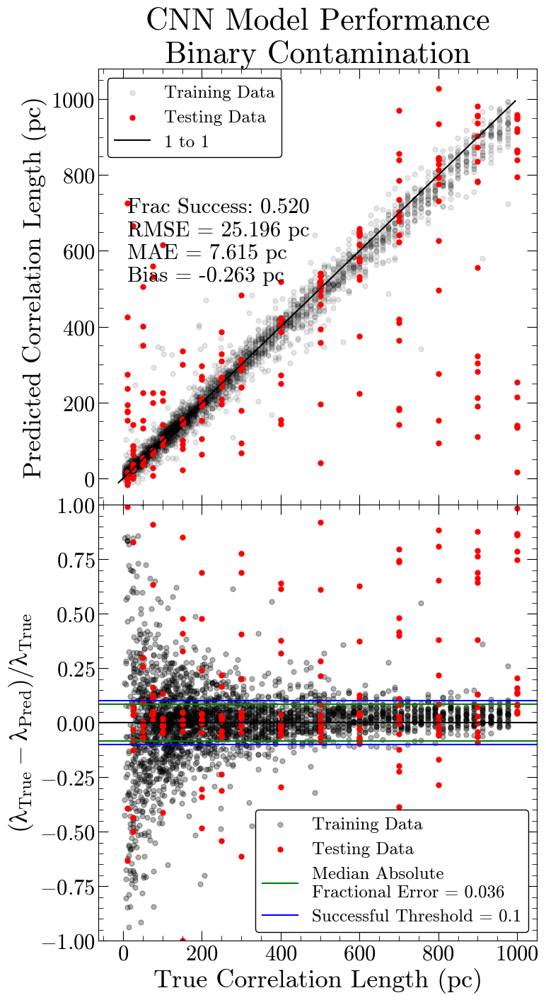

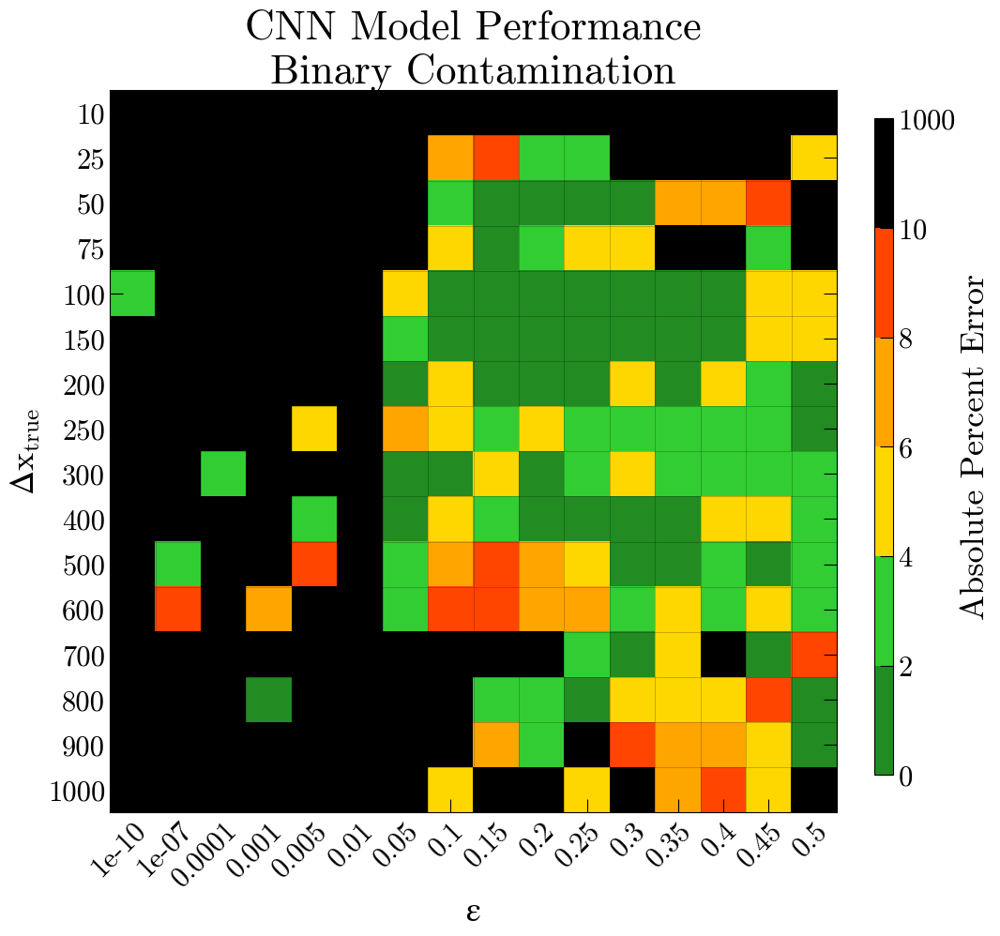

Number of squares with abs percent err>10%,  123


In [50]:
final_plot('04','CNN Model Performance\nBinary Contamination',statdy=60)